# fig_clusHFA

### This notebook generates figures related to generating group HFA responses and categorizing distinct neural response functions (e.g., visual, motor, and reward)




In [1]:
#import packages
import numpy as np # numpy
import pandas as pd # pandas
import mne
import pickle
import os
from scipy.io import loadmat # to load matlab
from scipy import stats,ndimage,signal,spatial
import numpy.random as rand
import pycircstat as circ
import fooof as ff
import tensorpac as tp
import ccdt_func as cc
#FDR correction
from statsmodels.stats.multitest import multipletests as FDR

# plotting
import matplotlib
#matplotlib.use('macosx')
#matplotlib.use('Qt5Agg')

# this makes tight axes 
matplotlib.rcParams['axes.autolimit_mode'] = 'round_numbers'
matplotlib.rcParams['axes.xmargin'] = 0
matplotlib.rcParams['axes.ymargin'] = 0
matplotlib.rcParams['axes.labelsize'] = 20
matplotlib.rcParams['axes.spines.right'] = False
matplotlib.rcParams['axes.spines.top'] = False
matplotlib.rcParams['xtick.labelsize'] = 20
matplotlib.rcParams['ytick.labelsize'] = 20
matplotlib.rcParams['legend.fontsize'] = 20
matplotlib.rcParams['font.size'] = 20
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt 

# create fig dir
fig_dir = os.getcwd()+'/figs/fig_clusHFA/'
if os.path.exists(fig_dir)==False:
     os.mkdir(fig_dir)
        
def save_fig(fname,do_tight = True):
    ax = plt.gca()
    if do_tight == True:
        plt.tight_layout()
    plt.savefig(fname = fig_dir+fname+'.pdf')
    #plt.savefig(fname = fig_dir+fname+'.png')


/home/ashwinramayya/Environments/ccdt/lib/python3.8/site-packages/nilearn/datasets/__init__.py:93: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "
/home/ashwinramayya/Environments/ccdt/lib/python3.8/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.0, the latest is 0.5.1.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [2]:
%%capture
# Collect Group taskstats Data
C = cc.Collection(collection_lbl='all')

beh_feat = 'zrrtStoch' # beh_feat = 'zrrt'
atlas = 'yeo' 
#atlas='default'


C.doTaskStats_2d(pow_frange_lbl = 'HFA',
pow_method = 'wave',
pow_evQuery = 'error==0&fastResponse==0&badTrial==0',
do_zscore = True,
apply_gauss_smoothing = True,
gauss_sd_scaling = 0.075,
apply_time_bins=False,num_iters=1000,
time_bin_size_ms=100,overwriteFlag =False,feat_list_beh=[beh_feat])



#### Anatomical distribution of all electrodes

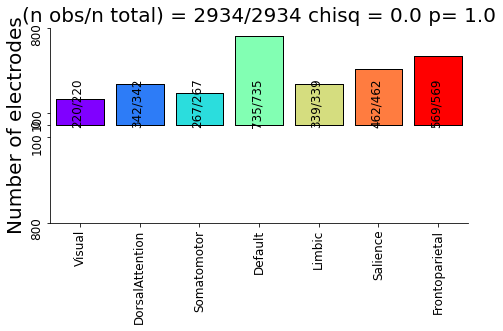

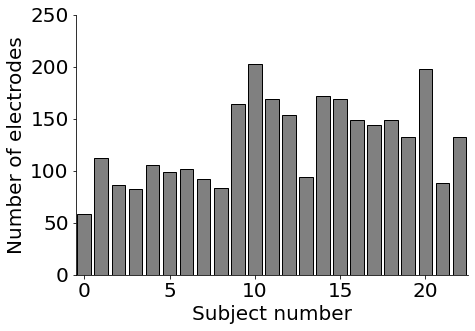

In [3]:
C.evalClus_anat(fsize=(7,5),yL=None,plot_raw_counts=True,\
                use_colormap=True, plot_by_hemis = False,\
                fsize_tick = 12,fsize_lbl = 20,atlas=atlas)
plt.tight_layout()

plt.savefig(fname = (os.getcwd()+'/figs/anat/dist.pdf'))


# plot number of electrodes per subject
e_counts = []
subj_list = np.unique(C.subj_list)
f = plt.figure(figsize=(7,5))
ax = plt.subplot(111)
count=-1
for s in subj_list:
    count+=1
    e_counts.append(np.sum(np.array(C.subj_list)==s))
    plt.bar(count,e_counts[count],color = '0.5',edgecolor = 'k')
ax.set_xlim(-.5,count+.5)
ax.set_ylabel('Number of electrodes')
ax.set_xlabel('Subject number')
plt.tight_layout()
plt.savefig(fname = (os.getcwd()+'/figs/anat/numElec.pdf'))


#### Evaluate stimulus- and response-locked effects before and after Gaussian modeling

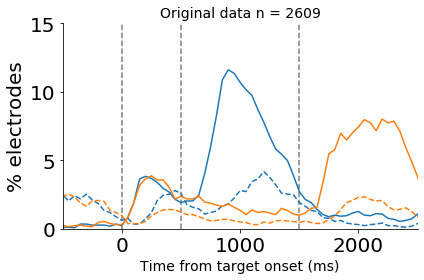

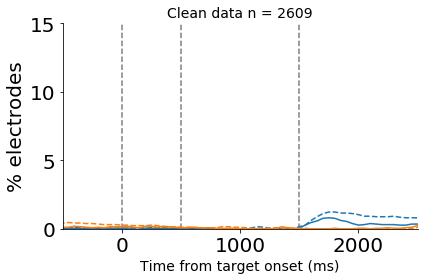

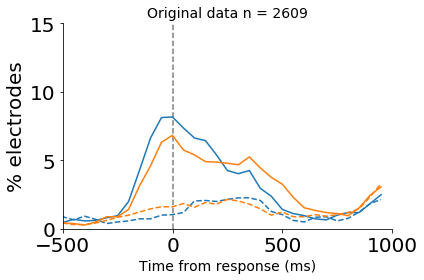

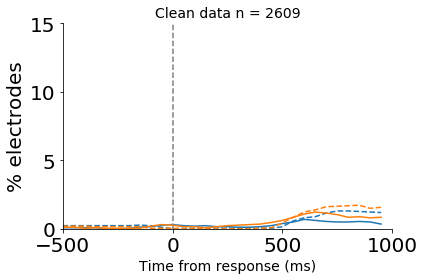

In [4]:
C.evalClus_taskstatsTimeCourseByTime(ax = None,ret_idx = np.array(C.isBadElectrode_list)==False,\
                                        xL_ms = (-500,2500),yL = (0,15),\
                                        time_bin_size_ms = 50,use_resp_locked=False,\
                                        use_clean_data = False, plot_counts = True,z_thresh = 2,
                                        print_status=False);
plt.gca().legend().remove()
save_fig('taskCounts_original')

C.evalClus_taskstatsTimeCourseByTime(ax = None,ret_idx = np.array(C.isBadElectrode_list)==False,\
                                        xL_ms = (-500,2500),yL = (0,15),time_bin_size_ms = 50,\
                                        use_resp_locked=False,use_clean_data = True, plot_counts = True,\
                                        z_thresh = 2,print_status=False);
plt.gca().legend().remove()
save_fig('taskCounts_clean')


C.evalClus_taskstatsTimeCourseByTime(ax = None,ret_idx = np.array(C.isBadElectrode_list)==False,\
                                        xL_ms = (-500,1000),yL = (0,15),\
                                        time_bin_size_ms = 50,use_resp_locked=True,\
                                        use_clean_data = False, plot_counts = True,z_thresh = 2,
                                        print_status=False);
plt.gca().legend().remove()
save_fig('taskCounts_original_respLocked')

C.evalClus_taskstatsTimeCourseByTime(ax = None,ret_idx = np.array(C.isBadElectrode_list)==False,\
                                        xL_ms = (-500,1000),yL = (0,15),time_bin_size_ms = 50,\
                                        use_resp_locked=True,use_clean_data = True, plot_counts = True,\
                                        z_thresh = 2,print_status=False);
plt.gca().legend().remove()
save_fig('taskCounts_clean_respLocked')


#### Explore neural correlates of RT variability and delay

In [3]:
%%capture
# filter to only include good electrodes (manually done above) and specific regions
goodElecsIdx = np.array(C.isBadElectrode_list)==False

# option to only filter good electrodes
C.filterElectrodes(filtE_bool= goodElecsIdx)

#option to filter to include specific brain regions and only good electrodes
#anatDf2,roiList2 = C.getAnatDf(ret_idx=None,cmap='rainbow',atlas='yeo');
#retIdx = (anatDf2['roi']=='Visual') | \
#(anatDf2['roi']=='Limbic') | \
#(anatDf2['roi']=='Salience') | \
#(anatDf2['roi']=='Somatomotor') 
#C.filterElectrodes(filtE_bool=retIdx&goodElecsIdx)



# cluster based on features
C.clusterElectrodesByTaskStats(feat_option='selectivity',binarize_stats=True)
#C.clusterElectrodesByTaskStats(feat_option='selectivity_rtOnly',binarize_stats=True)
#C.clusterElectrodesByTaskStats(feat_option='selectivity_delayOnly',binarize_stats=True)
#C.clusterElectrodesByTaskStats(feat_option='selectivity_anat',binarize_stats=True,atlas=atlas)


# get target-locked pow
C.getPow_2d(pow_evType='FIX_START',pow_frange_lbl = 'HFA',pow_method = 'wave',pow_evQuery = 'error==0&fastResponse==0&badTrial==0',paramsDict = {},do_zscore = True,apply_gauss_smoothing = True,gauss_sd_scaling = 0.075,apply_time_bins=True,time_bin_size_ms=50,overwriteFlag=False)

# create a shallow copy and get response-locked power
import copy
C2 = copy.copy(C)
C2.getPow_2d(pow_evType='RESPONSE',pow_frange_lbl = 'HFA',pow_method = 'wave',pow_evQuery = 'error==0&fastResponse==0&badTrial==0',paramsDict = {},do_zscore = True,apply_gauss_smoothing = True,gauss_sd_scaling = 0.075,apply_time_bins=True,time_bin_size_ms=50,overwriteFlag=False)

# get errors
C_err = copy.copy(C)
C_err.getPow_2d(pow_evType='FIX_START',pow_frange_lbl = 'HFA',pow_method = 'wave',pow_evQuery = 'RT<0&delay==1500',paramsDict = {},do_zscore = True,apply_gauss_smoothing = True,gauss_sd_scaling = 0.075,apply_time_bins=True,time_bin_size_ms=50,overwriteFlag=False)

# get errors
C2_err = copy.copy(C)
C2_err.getPow_2d(pow_evType='RESPONSE',pow_frange_lbl = 'HFA',pow_method = 'wave',pow_evQuery = 'RT<0&delay==1500',paramsDict = {},do_zscore = True,apply_gauss_smoothing = True,gauss_sd_scaling = 0.075,apply_time_bins=True,time_bin_size_ms=50,overwriteFlag=False)

In [4]:
# explore levels
def explore_level(cut_level,yL = (-1,2),beh_feat = 'zrrt',atlas='default',min_subj = 5, min_elec=50):
    try:
        C.clus_plotDendrogram(cut_level=cut_level+1,figsize=(7,7))
        plt.gcf().tight_layout()    
        save_fig(fname='cut_level'+str(cut_level)+'-dend')
    except:
        pass
    
    # collect p-values
    p_list = []
    lbl_list = []
    stats_table = []
    
    #clusid=-1
    for i in np.arange(0,cut_level+1):
        clusid=i

        # ret_idx
        ret_idx = C.clus_cut_tree[:,cut_level]==clusid

        # calc num subj
        n_subj = np.count_nonzero(C.collapseBySubj_1d(ret_idx))
        print('\n')
        print('clus id',clusid,'n elec = ', np.count_nonzero(ret_idx), 'n subj = ',n_subj)

        if (n_subj<min_subj) | (np.count_nonzero(ret_idx)<min_elec):
            continue
            
        # calc number of rt predictive
        pvals = C.taskstats2d_df['rtRegress_multivar_'+beh_feat+'_SSE'+'_pvalnp'].to_numpy()[ret_idx]
        prct_sig = 100*(np.sum(pvals<0.05)/len(pvals))
        
        # calc num w delay related activity
        delay_idx = np.abs(C.taskstats2d_df['modParams_postNoCCS_amp'].to_numpy()[ret_idx])
        prct_delay =100*(np.sum(delay_idx)/len(delay_idx))
        
        
        # create figure
        figsize=(10,5)
        f = plt.figure(figsize=figsize,facecolor='w',num=str(cut_level)+'-'+str(clusid)) 


        # create subplots and axes
        gs = f.add_gridspec(nrows=2,ncols=6)
        ax_fix = f.add_subplot(gs[:,0:4])
        ax_resp = f.add_subplot(gs[:,4:])
        #ax_anat = f.add_subplot(gs[1,4:])

        
        # plot targ-locked power
        C.evalClus_powByRT2d(ax = ax_fix,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=False,delays_list=[500,1500])
        # plot targ error
        #C_err.evalClus_powByRT2d(ax = ax_fix,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=False,color = '0.5',alpha=0.5)
        ax_fix.legend().remove()
        ax_fix.set_xlabel('Time from target (ms)',fontsize=20)
        ax_fix.set_ylabel('HFA',fontsize=20)
        ax_fix.set_title('')
        ax_fix.set_yticks(np.linspace(yL[0],yL[1],4))
        ax_fix.set_yticklabels(np.round(ax_fix.get_yticks(),2),fontsize=20)
        ax_fix.set_title(('ID-'+str(cut_level)+'-'+str(clusid)+' (n elec = '+str(np.count_nonzero(ret_idx))\
                             +'; n subj = '+str(n_subj)+')'),fontsize=20)
        #save_fig('cut_level'+str(cut_level)+'-'+str(clusid)+'-targPow')
        
        # plot resp-locked power
        C2.evalClus_powByRT2d(ax=ax_resp,ret_idx = ret_idx,xL_ms=(-1000,1000),figsize=(5,5),yL=yL,binByRT=False,delays_list=[500,1500])
        # plot resp error
        #C2_err.evalClus_powByRT2d(ax = ax_resp,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=False,xL_ms=(-1000,1000),color = '0.5',alpha=0.5)
        ax_resp.legend().remove()
        ax_resp.set_title('')
        ax_resp.set_yticks((yL[0],yL[1]))
        ax_resp.set_yticklabels([],fontsize=20)
        ax_resp.set_xlabel('Time from response (ms)')
        ax_resp.set_ylabel('')
        #plt.gca().set_xticks(-500,0,500)
        #plt.gca().set_title('% rt pred '+str(np.round(prct_sig,2))+' % delay '+str(np.round(prct_delay,2)),fontsize=20)        
        #C2_err.evalClus_powByRT2d(ax=plt.gca(),ret_idx = ret_idx)
        #save_fig('cut_level'+str(cut_level)+'-'+str(clusid)+'-respPow')
        save_fig('cut_level'+str(cut_level)+'-'+str(clusid)+'-timecourse')
        
        # plot anat
        C.evalClus_anat(ax=None,ret_idx = ret_idx,use_colormap=True, plot_by_hemis = True,\
                        yL=None,title = str(np.count_nonzero(ret_idx)),\
                        fsize=(5,5),fsize_lbl=10,atlas=atlas)
        plt.gca().set_title('')
        #plt.gca().invert_yaxis()
        plt.gca().set_ylabel('% electrodes',fontsize=20)
        plt.gca().set_yticklabels(plt.gca().get_yticklabels(),rotation=90,fontsize=20)
        #plt.gca().set_ylim(0,plt.gca().get_ylim()[-1])
        save_fig('cut_level'+str(cut_level)+'-'+str(clusid)+'-anat')#+atlas
        
        
        # plot RT- finger print
        # create subplots and axes
        f = plt.figure(figsize=[5,5])
        gs = f.add_gridspec(nrows=2,ncols=1)
        ax_rt = f.add_subplot(gs[0,0])
        ax_delay = f.add_subplot(gs[1,0])
        
        use_clean = True
        collapseBySubj_flag = False
        C.evalClus_rtCorrCounts(ax=ax_rt,beh_feat=beh_feat,use_clean = use_clean,delay_str = '',ret_idx = ret_idx,yL=(-100,100))
        #ax_rt.set_xticklabels(ax_rt.get_xticks(),fontsize=20,rotation=0)
        ax_rt.set_title('')
        ax_rt.set_ylabel('')
        
        C.evalClus_delayDiffCounts(ax = ax_delay,use_clean = False, ret_idx = ret_idx,yL=(-100,100))
        #ax_delay.set_xticklabels(ax_delay.get_xticks().astype('int'),fontsize=20,rotation=0)
        ax_delay.set_title('')
        ax_delay.set_ylabel('')
        save_fig('cut_level'+str(cut_level)+'-'+str(clusid)+'-rtCorr')
        #C.evalClus_rtCorrCounts(use_clean = use_clean,delay_str = 'S',ret_idx = ret_idx,yL=(0,50))
        #C.evalClus_rtCorrCounts(use_clean = use_clean,delay_str = 'L',ret_idx = ret_idx,yL=(0,50))
        
        # plot selectivity finger print
        counts_dict = C.evalClus_fingerprint(ax = None,ret_idx = ret_idx, \
                               sel_feat_list = ['ptCorr_postTarg','errSel','rewSel','spatialSel'],\
                               p_thresh=0.05,use_roiList=True,count_by_hemis = False,\
                               count_anyChange=False,plot_option='sel',yL=[0,35],atlas=atlas)
        plt.gca().set_xticklabels(plt.gca().get_xticks()+1,fontsize=20,rotation=0)
        plt.gca().set_ylabel('% electrodes',fontsize=20)
        plt.gca().set_xlim((plt.gca().get_xticks()[0]-.5,plt.gca().get_xticks()[-1]+.5))
        plt.gca().set_title('$\chi^{2} = $'+str(np.round(counts_dict['chisq'],2))+\
                            ' $p = $'+str(np.round(counts_dict['pval'],3)))
        save_fig('cut_level'+str(cut_level)+'-'+str(clusid)+'-sel')
        
        # collect p vals and lbls
        p_list.append(counts_dict['pval'])
        lbl_list.append(str(cut_level)+'-'+str(clusid))
        
        # stats_dict
        stats_dict={}
        stats_dict['clusId'] = str(cut_level)+'-'+str(clusid)
        stats_dict['n_obs'] = counts_dict['n_totInClus']
        stats_dict['chiSq'] = np.round(counts_dict['chisq'],2)
        stats_dict['p'] = np.round(counts_dict['pval'],2)
        
        
        # append to stats_table
        stats_table.append(stats_dict)
        

        # plot x subj correlation
        #C.plotXSubjCorr_list(ax=None,beh_xSubj='rtDiff_mean',use_clean = True, delay_str = '',ret_idx = ret_idx)
        #C.plotXSubjCorr_list(ax=None,beh_xSubj='rtDiff_std',use_clean = True, delay_str = '',ret_idx = ret_idx)
        #C.plotXSubjCorr_list(ax=None,beh_xSubj='error_diff',use_clean = True, delay_str = '',ret_idx = ret_idx)
        
        
        # plot delay related differences
        #C.evalClus_delayDiffCounts(use_clean = False, ret_idx = ret_idx,yL=(0,50))

        
        

        #brain plot
        #C.evalClus_brainPlot(ret_idx=ret_idx)
        
    # stats df
    stats_df = pd.DataFrame(stats_table)
        
    return p_list,lbl_list, stats_df

def get_num_generalized_clusters(cut_level,min_subj = 5, min_elec=50):
    #This function will compute how many clusters meet the miminum subject and electrode criteria for a given cluster level    clusid=-1
    
    clusid = -1
    num_clus = 0
    for i in np.arange(-1,cut_level):
        clusid+=1

        # ret_idx
        ret_idx = C.clus_cut_tree[:,cut_level]==clusid

        # calc num subj
        n_subj = np.count_nonzero(C.collapseBySubj_1d(ret_idx))

        if (n_subj>=min_subj) & (np.count_nonzero(ret_idx)>=min_elec):
            num_clus+=1
    return num_clus
    
def evalClus_wrapper(ret_idx,yL = (-1,2.75),beh_feat = 'zrrt',neu_feat = None,lbl = None,binByRT=True,show_false_alarms = False,atlas='default',inv_anat_yaxis=False,anat_yL=(-40,40)):
    # eval average activation function for a group of electrodes

    # create figure
    figsize=(10,5)
    f = plt.figure(figsize=figsize,facecolor='w') 


    # create subplots and axes
    gs = f.add_gridspec(nrows=2,ncols=6)
    ax_fix = f.add_subplot(gs[:,0:4])
    ax_resp = f.add_subplot(gs[:,4:])


    # plot targ-locked power
    C.evalClus_powByRT2d(ax = ax_fix,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=binByRT)
    # plot targ error
    if show_false_alarms == True:
        C_err.evalClus_powByRT2d(ax = ax_fix,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=False,color = '0.5',alpha=0.5)
    ax_fix.legend().remove()
    ax_fix.set_xlabel('Time from target (ms)',fontsize=20)
    ax_fix.set_title('')


    # plot resp-locked power
    C2.evalClus_powByRT2d(ax=ax_resp,ret_idx = ret_idx,xL_ms=(-1000,1000),figsize=(5,5),yL=yL,binByRT=binByRT)
    # plot resp error
    if show_false_alarms == True:
        C2_err.evalClus_powByRT2d(ax = ax_resp,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=False,xL_ms=(-1000,1000),color = '0.5',alpha=0.5)
    ax_resp.legend().remove()
    ax_resp.set_title('')
    
    
    # save figure
    save_fig(lbl+'_actFunc')


    # plot anat
    plot_dict = C.evalClus_anat(ax=None,ret_idx = ret_idx,\
                    use_colormap=True, plot_by_hemis = False,\
                    yL=anat_yL,title = str(np.count_nonzero(ret_idx)),fsize=(5,5),fsize_lbl=10,atlas=atlas,add_text_labels=False,alpha_hline=0.05)
    #plt.gca().set_title('')
    if inv_anat_yaxis==True:
        plt.gca().invert_yaxis()
    plt.gca().set_ylabel('% electrodes',fontsize=20)
    plt.gca().set_yticklabels(plt.gca().get_yticklabels(),rotation=90,fontsize=20)
    save_fig(lbl+'_anat-'+atlas)
#     # x subj corr
#     # Specific cluster correlation with bias parameter
#     C.plotXSubjDelayDiff(ax=None,beh_xSubj='paramsDiff_B',neu_feat=neu_feat,use_clean = False, ret_idx = ret_idx,figsize=(7,5),s=400)
#     plt.gca().set_ylabel('$\Delta$ anticipatory bias',fontsize=20)
#     plt.gca().set_xlabel('$\Delta$ '+neu_feat,fontsize=20)
#     plt.tight_layout()
    return plot_dict





def fdr_wrapper(p_list,lbls_list):
    # make sure there are no nans
    p_list = np.array(p_list)
    p_list[np.isnan(p_list)]=1
    reject,pvals_corrected,AS,AB =  FDR(pvals = p_list, alpha = 0.05,method = 'fdr_bh')

    print('\n')
    print('FDR-corrected p values')
    print(np.hstack((np.array(lbls_list).squeeze()[:,np.newaxis],\
                     np.array(np.round(pvals_corrected,3)).squeeze()[:,np.newaxis])))
    
    return pvals_corrected

#### Where are correlates of LATER (specific combination of RT and LATER selectivity)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/home/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12143: RuntimeWarning: Mean of empty slice
  binPowMat_mean = np.nanmean(binPowMat,axis=0)
/home/ashwinramayya/Environments/ccdt/lib/python3.8/site-packages/numpy/core/_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/ashwinramayya/Environments/ccdt/lib/python3.8/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/home/ashwinramayya/Environments/ccdt/lib/python3.8/site-packages/numpy/core/_methods.py:251

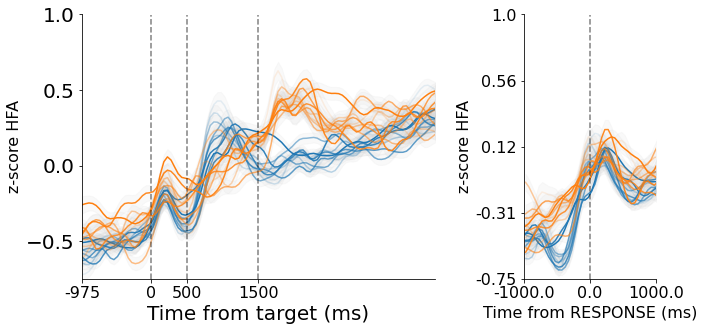

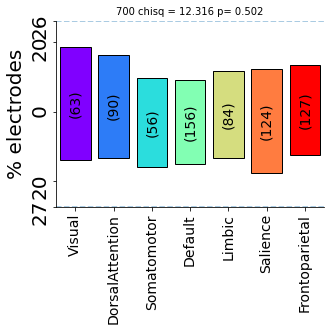

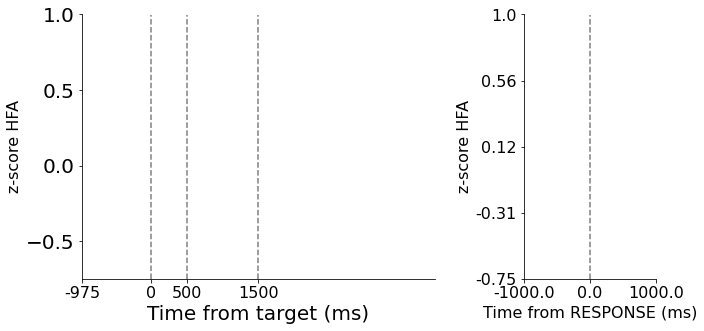

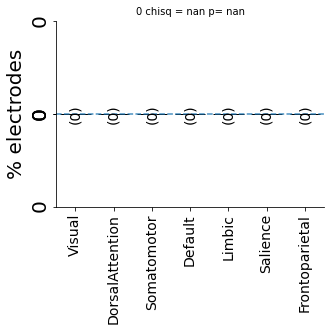

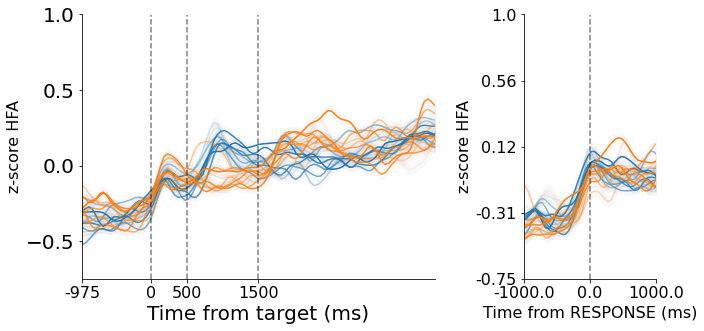

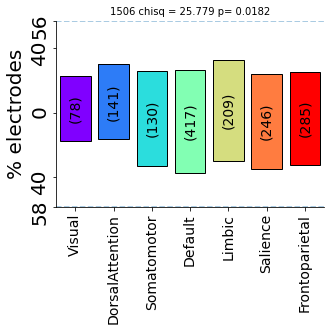

In [7]:
# expected fingerprint for LATER (hard-coded based on "selectivity" clustering as below)
# C.clus_featLbls = ['rtCorr_zrrtStoch_S0f_clean_zstatnp',
#  'rtCorr_zrrtStoch_S0c_clean_zstatnp',
#  'delayDiff_S0c_zstatnp',
#  'rtCorr_zrrtStoch_postCC_clean_zstatnp',
#  'delayDiff_postCC_zstatnp',
#  'rtCorr_zrrtStoch_postCC_bur_clean_zstatnp',
#  'delayDiff_postCC_bur_zstatnp',
#  'rtCorr_zrrtStoch_preResponse_bur_clean_zstatnp',
#  'delayDiff_preResponse_bur_zstatnp',
#  'rtCorr_zrrtStoch_preResponse_clean_zstatnp',
#  'delayDiff_preResponse_zstatnp']
featVec_template = np.tile(np.array([0,0,1,0,1,-1,0,-1,0,0,0]),reps = (len(C.clus_featMat_noz),1))


#create an array that identifies a match beween electrode profile and later template profile
featMat_match = np.abs(C.clus_featMat_noz-featVec_template)

# define
later_idx_any = (featMat_match[:,2]==0)|(featMat_match[:,4]==0)|(featMat_match[:,5]==0)|(featMat_match[:,7]==0)
later_idx_all = (featMat_match[:,2]==0)&(featMat_match[:,4]==0)&(featMat_match[:,5]==0)&(featMat_match[:,7]==0)
later_idx_none = (featMat_match[:,2]==1)&(featMat_match[:,4]==1)&(featMat_match[:,5]==1)&(featMat_match[:,7]==1)
yL = (-.75,1)
plot_dict_any =evalClus_wrapper(later_idx_any,beh_feat=beh_feat,yL = yL,lbl='laterCorr_any',atlas=atlas)
plot_dict_all =evalClus_wrapper(later_idx_all,beh_feat=beh_feat,yL = yL,lbl='laterCorr_all',atlas=atlas)
plot_dict_none =evalClus_wrapper(later_idx_none,beh_feat=beh_feat,yL = yL,lbl='laterCorr_none',atlas=atlas)

:::Observed frequency of RT-predictive electrodes vs. chance:::
n obs 638 / 2609 ;  24.454 %
chisq =  2078.691190413749   p =  0.0


uncorrected p values
Visual 29.38 %  p =  0.0
DorsalAttention 27.06 %  p =  0.0
Somatomotor 34.7 %  p =  0.0
Default 18.62 %  p =  0.0
Limbic 19.16 %  p =  0.0
Salience 24.04 %  p =  0.0
Frontoparietal 27.99 %  p =  0.0


FDR-corrected p values
[['Visual' '0.0']
 ['DorsalAttention' '0.0']
 ['Somatomotor' '0.0']
 ['Default' '0.0']
 ['Limbic' '0.0']
 ['Salience' '0.0']
 ['Frontoparietal' '0.0']]


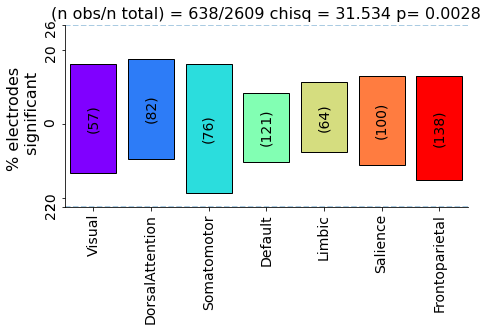

In [8]:
# all RT predictive
ret_idx =  C.taskstats2d_df['rtRegress_multivar_zrrtStoch_SSE'+'_pvalnp'].to_numpy()<0.05
plot_dict = C.evalClus_anat(ret_idx=ret_idx,use_colormap=True, plot_by_hemis = True,plot_raw_counts=False,atlas=atlas);
#plot_dict = C.plotRegressCountsByRegion_SSE(ret_idx=ret_idx,p_thresh=0.05,beh_feat=beh_feat,use_colormap=True)
plt.gca().set_ylabel('% electrodes \n significant')
#print(plot_dict.keys())
save_fig('rtVar_byRegion_noBadElecs')

# print stats: more RT than chance?
chisq,p = stats.chisquare(f_obs=(np.sum(ret_idx),np.sum(ret_idx==False)), \
                                  f_exp=((0.05*len(ret_idx)),0.95*len(ret_idx)))
print(':::Observed frequency of RT-predictive electrodes vs. chance:::')
print('n obs',np.sum(ret_idx),'/',len(ret_idx),'; ',np.round(100*np.sum(ret_idx)/len(ret_idx),3),'%')
print('chisq = ',chisq,'  p = ',p)


# print stats: uniform anatomical distribution?
# print('\n')
# print(':::observed frequecies by region (expected 5%)')
# print(np.round(np.array(plot_dict['counts_thisClusInReg'])/np.array(plot_dict['counts_numInReg'])*100,2))
# print(':::observed electrodes by region')
# print(np.array(plot_dict['counts_thisClusInReg']))
# print(':::total electrodes by region')
# print(np.array(plot_dict['counts_numInReg']))
print('\n')
print('uncorrected p values')
# print stats: regions with more freqent rt repressentations by chance?
p_list = []
stats_table = []
for r in plot_dict['roi_list']:
    r_idx = plot_dict['roi_list'].index(r)
    tot = plot_dict['counts_numInReg'][r_idx]
    obs =  plot_dict['counts_thisClusInReg'][r_idx]
    chisq,p = stats.chisquare(f_obs=(obs,tot-obs), \
                                  f_exp=((0.05*tot),0.95*tot))   
    print(r,np.round(100*(obs/tot),2),'%',' p = ',np.round(p,3))
    p_list.append(p)
    # stats dict
    stats_dict = {}
    stats_dict['roi'] = r
    stats_dict['obs'] = obs
    stats_dict['tot'] = tot
    stats_dict['%'] = np.round(100*(obs/tot),2)
    stats_dict['chiSq'] = np.round(chisq,2)
    stats_dict['p'] = np.round(p,2)
    
    stats_table.append(stats_dict)
# print stats table to file
stats_df = pd.DataFrame(stats_table)

#FDR correction
pvals_corrected = fdr_wrapper(p_list,plot_dict['roi_list'])

# update df with corrected p-values
stats_df.insert(len(stats_df.columns),'p_corr',np.round(pvals_corrected,2))
#save table
stats_df.to_csv(fig_dir+'stochRTByRegion_omnibus.csv')



/home/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:9187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(np.abs(ax.get_yticks()).astype('int'))
/home/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:9187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(np.abs(ax.get_yticks()).astype('int'))


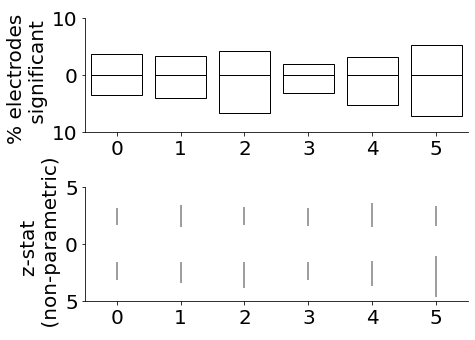

In [9]:
# by specific neural feature
neu_feat_list = ['S0f','S0c','postCC','postCC_bur','preResponse_bur','preResponse'] 


f = plt.figure(figsize=[7,5])
gs = f.add_gridspec(nrows=2,ncols=1)
ax_counts = f.add_subplot(gs[0,0])
ax_z = f.add_subplot(gs[1,0])

# Overall relation between RT and neural activity
plot_dict = C.plotCorr_counts(ax=ax_counts,beh_feat=beh_feat,\
                              neu_feat_list=neu_feat_list,\
                              use_clean = True,fsize_lbl=20,delay_str = '',ret_idx =  None,\
                              plot_z=False, plot_counts=True)
ax_counts.set_title('')
#ax_counts.set_xlim(0.5,6.5)
# Overall relation between RT and neural activity
C.plotCorr_counts(ax=ax_z,beh_feat=beh_feat,\
                              neu_feat_list=neu_feat_list,\
                              use_clean = True,fsize_lbl=20,delay_str = '',ret_idx =  None,\
                              plot_z=True, plot_counts=False);
ax_z.set_title('')
#ax_z.set_xlim(0.5,6.5)

#plt.gca().set_ylabel('% electrodes \n significant')
save_fig('rtVar_byNeuralFeat_noBadElecs')

#### RT pos Corr vs. RT neg corr vs. RT no corr

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.




RT - Pos Corr; uncorrected p values
406
Visual 45 / 194 23.2 %  p =  0.0
DorsalAttention 47 / 303 15.51 %  p =  0.0
Somatomotor 48 / 219 21.92 %  p =  0.0
Default 87 / 650 13.38 %  p =  0.0
Limbic 39 / 334 11.68 %  p =  0.0
Salience 68 / 416 16.35 %  p =  0.0
Frontoparietal 72 / 493 14.6 %  p =  0.0


No handles with labels found to put in legend.




RT - Neg Corr; uncorrected p values
540
Visual 32 / 194 16.49 %  p =  0.0
DorsalAttention 67 / 303 22.11 %  p =  0.0
Somatomotor 66 / 219 30.14 %  p =  0.0
Default 129 / 650 19.85 %  p =  0.0
Limbic 53 / 334 15.87 %  p =  0.0
Salience 91 / 416 21.88 %  p =  0.0
Frontoparietal 102 / 493 20.69 %  p =  0.0


Pos v Corr; uncorrected p values
Visual 45 vs 32 20.69 %  p =  0.138
DorsalAttention 47 vs 67 20.69 %  p =  0.061
Somatomotor 48 vs 66 20.69 %  p =  0.092
Default 87 vs 129 20.69 %  p =  0.004
Limbic 39 vs 53 20.69 %  p =  0.144
Salience 68 vs 91 20.69 %  p =  0.068
Frontoparietal 72 vs 102 20.69 %  p =  0.023


FDR-corrected p values
[['Visual' '0.144']
 ['DorsalAttention' '0.119']
 ['Somatomotor' '0.129']
 ['Default' '0.03']
 ['Limbic' '0.144']
 ['Salience' '0.119']
 ['Frontoparietal' '0.08']]


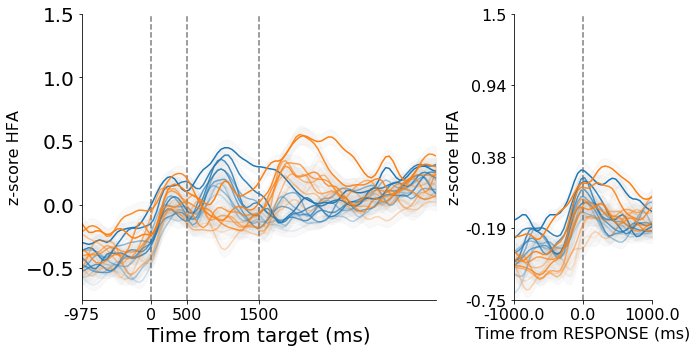

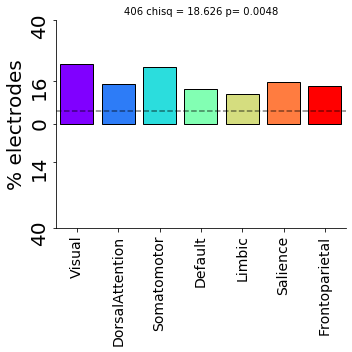

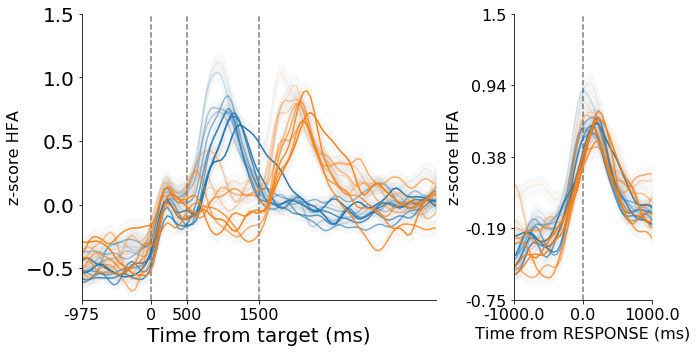

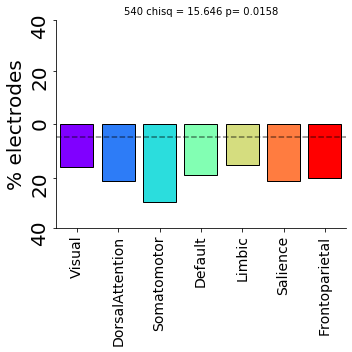

In [6]:
p_thresh=0.05
n_feat_list = ['S0f','S0c','postCC','postCC_bur','preResponse_bur','preResponse']

# any rt-related change
ret_idx_pos = np.zeros(len(C.taskstats2d_df)).astype('bool')
ret_idx_neg = np.zeros(len(C.taskstats2d_df)).astype('bool')

for n in n_feat_list:
    is_sig = (C.taskstats2d_df['rtCorr_'+beh_feat+'_'+n+'_clean_pvalnp'].to_numpy()<p_thresh)
    is_pos = C.taskstats2d_df['rtCorr_'+beh_feat+'_'+n+'_clean_rval'].to_numpy()>0
    is_neg = C.taskstats2d_df['rtCorr_'+beh_feat+'_'+n+'_clean_rval'].to_numpy()<0
    ret_idx_pos =  ret_idx_pos|(is_sig&is_pos)
    ret_idx_neg =  ret_idx_neg|(is_sig&is_neg)

yL = (-.75,1.5)
plot_dict_pos = evalClus_wrapper(ret_idx_pos,beh_feat=beh_feat,yL = yL,lbl='rtVar-ANY-posCorr-',atlas=atlas)
print('\n')
print('RT - Pos Corr; uncorrected p values')
print(np.sum(plot_dict_pos['counts_thisClusInReg']))

# print stats: regions with more freqent rt repressentations by chance?
p_list = []

for r in plot_dict_pos['roi_list']:
    r_idx = plot_dict_pos['roi_list'].index(r)
    tot = plot_dict_pos['counts_numInReg'][r_idx]
    obs =  plot_dict_pos['counts_thisClusInReg'][r_idx]
    chisq,p = stats.chisquare(f_obs=(obs,tot-obs), \
                                  f_exp=((0.05*tot),0.95*tot))   
    print(r,obs,'/',tot,np.round(100*(obs/tot),2),'%',' p = ',np.round(p,3))
    p_list.append(p)

plot_dict_neg =evalClus_wrapper(ret_idx_neg,beh_feat=beh_feat,yL = yL,lbl='rtVar-ANY-negCorr-',atlas=atlas,inv_anat_yaxis=True)
print('\n')
print('RT - Neg Corr; uncorrected p values')
print(np.sum(plot_dict_neg['counts_thisClusInReg']))
# print stats: regions with more freqent rt repressentations by chance?
p_list = []


for r in plot_dict_neg['roi_list']:
    r_idx = plot_dict_neg['roi_list'].index(r)
    tot = plot_dict_neg['counts_numInReg'][r_idx]
    obs =  plot_dict_neg['counts_thisClusInReg'][r_idx]
    chisq,p = stats.chisquare(f_obs=(obs,tot-obs), \
                                  f_exp=((0.05*tot),0.95*tot))   
    print(r,obs,'/',tot,np.round(100*(obs/tot),2),'%',' p = ',np.round(p,3))
    p_list.append(p)
    
# compare rates of pos and neg
print('\n')
print('Pos v Corr; uncorrected p values')
# print stats: regions with more freqent rt repressentations by chance?
p_list = []
stats_table = []
for r in plot_dict_neg['roi_list']:
    r_idx = plot_dict_neg['roi_list'].index(r)
    obs_pos = plot_dict_pos['counts_thisClusInReg'][r_idx]
    obs_neg =  plot_dict_neg['counts_thisClusInReg'][r_idx]
    chisq,p = stats.chisquare(f_obs=(obs_pos,obs_neg), \
                                  f_exp=None) # equal rates expected
    print(r,obs_pos,'vs',obs_neg,np.round(100*(obs/tot),2),'%',' p = ',np.round(p,3))
    p_list.append(p)
    
    # stats dict
    stats_dict = {}
    stats_dict['roi'] = r
    stats_dict['obs_pos'] = obs_pos
    stats_dict['obs_neg'] = obs_neg
    stats_dict['chiSq_PosVNeg'] = np.round(chisq,2)
    stats_dict['p_posVNeg'] = np.round(p,2)
    
    stats_table.append(stats_dict)
# print stats table to file
stats_df = pd.DataFrame(stats_table)

#FDR correction
pvals_corrected = fdr_wrapper(p_list,plot_dict_neg['roi_list'])

# update df with corrected p-values
stats_df.insert(len(stats_df.columns),'p_posVNeg_corr',np.round(pvals_corrected,2))
#save table
stats_df.to_csv(fig_dir+'stochRTByRegion_posVNeg-'+atlas+'.csv')

#### Cluster electrodes by shared specific RT-predictive relation

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

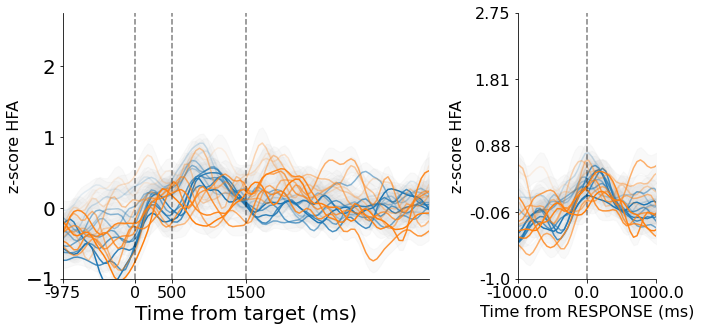

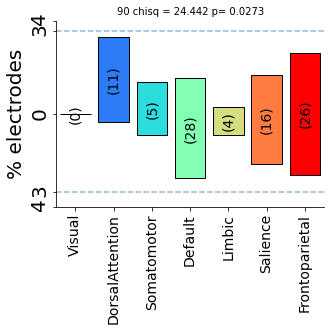

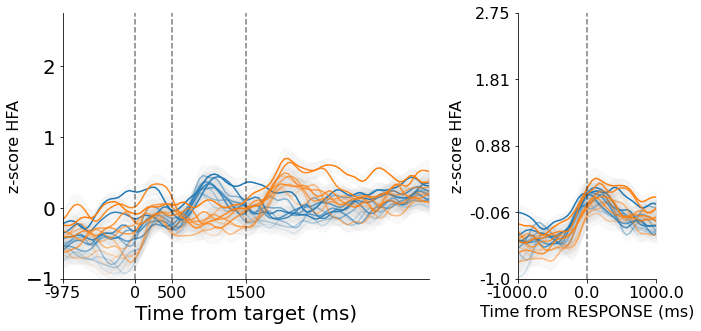

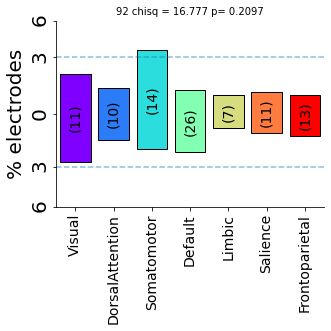

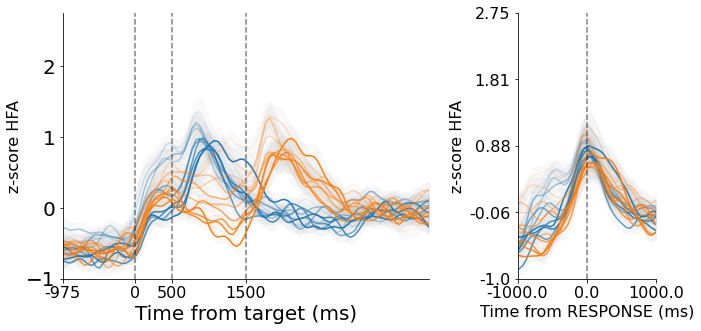

...

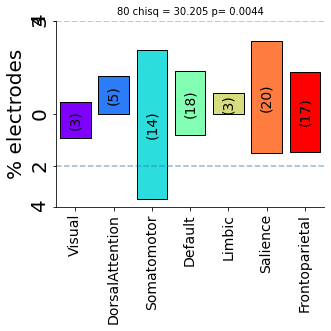

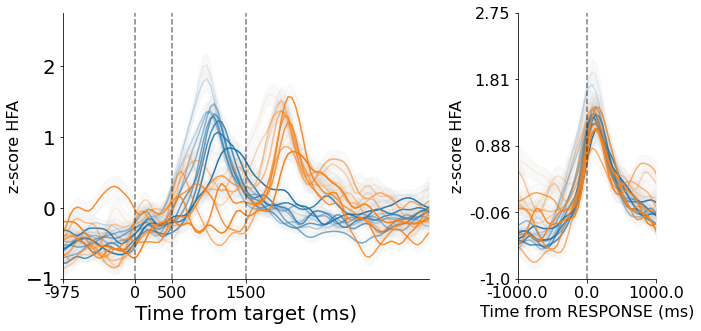

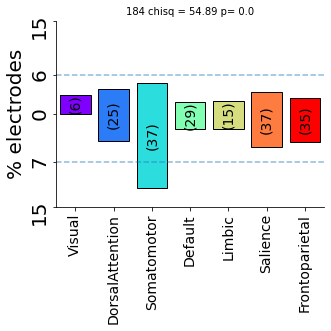

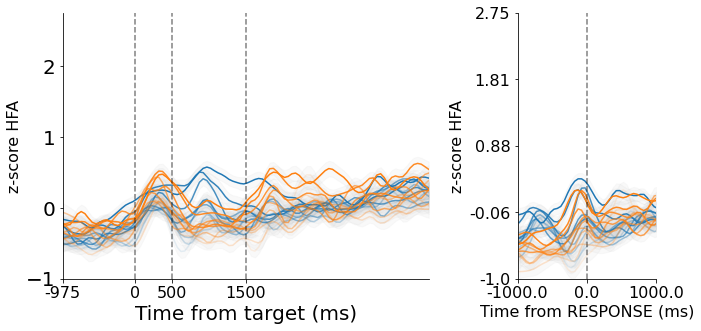

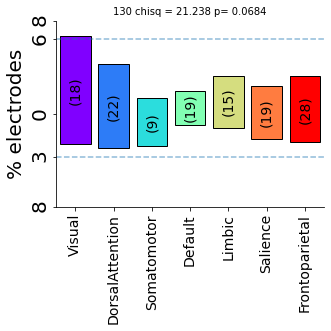

In [12]:
# plot anatomy bar plots and activation functions by specific features
p_thresh=0.05
n_feat_list = ['S0f','S0c','postCC','postCC_bur','preResponse_bur','preResponse']

for n in n_feat_list:
    is_neg = C.taskstats2d_df['rtCorr_'+beh_feat+'_'+n+'_clean_rval'].to_numpy()<0
    is_pos = C.taskstats2d_df['rtCorr_'+beh_feat+'_'+n+'_clean_rval'].to_numpy()>0
    ret_idx = C.taskstats2d_df['rtCorr_'+beh_feat+'_'+n+'_clean_pvalnp'].to_numpy()<p_thresh
    
    
    # parse neu feat (for xSubj correlation w bias parameter)
    if n =='S0f':
        neu_feat = 'S0c'
    else:
        neu_feat = n
    
    # (-) effects
    evalClus_wrapper(ret_idx&is_neg,beh_feat=beh_feat,neu_feat = neu_feat,lbl='rtVar-'+n+'-negCorr-',atlas=atlas)
    

    # (+) effects
    evalClus_wrapper(ret_idx&is_pos,beh_feat=beh_feat,neu_feat = neu_feat,lbl='rtVar-'+n+'-posCorr-',atlas=atlas)
    
    

#### Where are neural correlates of delay (~Temporal expectation)?

0.48715983135300883


/home/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:9304: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(np.abs(ax.get_yticks()).astype('int'))


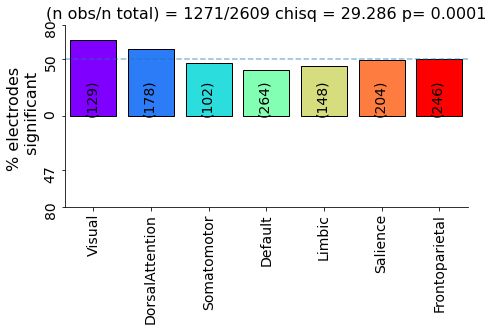

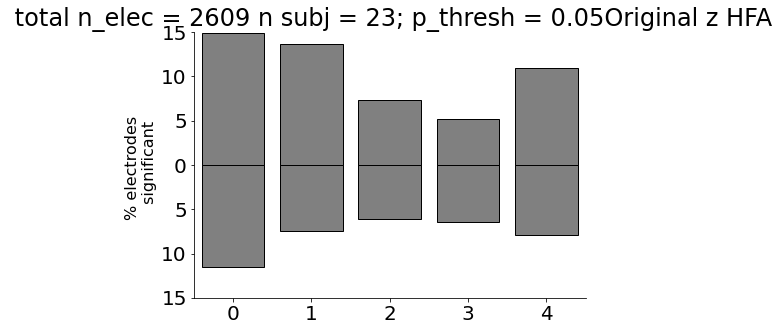

In [8]:
# Any delay related difference
p_thresh=0.05
n_feat_list = ['S0c','postCC','postCC_bur','preResponse_bur','preResponse']

# any delay-related change
ret_idx = np.zeros(len(C.taskstats2d_df)).astype('bool')

for n in n_feat_list:
    ret_idx =  ret_idx|(C.taskstats2d_df['delayDiff_'+n+'_pvalnp'].to_numpy()<p_thresh)

plot_dict = C.evalClus_anat(ret_idx=ret_idx,use_colormap=True, plot_by_hemis = False,plot_raw_counts=False,atlas=atlas);
#plot_dict = C.plotRegressCountsByRegion_SSE(ret_idx=ret_idx,p_thresh=0.05,beh_feat=beh_feat,use_colormap=True)
plt.gca().set_ylabel('% electrodes \n significant')
#print(plot_dict.keys())
save_fig('delay_byRegion_noBadElecs')

# Overall delay-related differences in neural features
plot_dict = C.plotDelayDiff_counts(figsize = (7,5),\
                              neu_feat_list=['S0c','postCC','postCC_bur','preResponse_bur','preResponse'],\
                              use_clean = False,ret_idx =  np.array(C.isBadElectrode_list)==False)
save_fig('delayDiff_byNeuralFeat_noBadElecs')


print(np.sum(ret_idx)/len(ret_idx))

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.




Delay - Pos Corr; uncorrected p values
832
Visual 98 / 194 50.52 %  p =  0.0
DorsalAttention 123 / 303 40.59 %  p =  0.0
Somatomotor 73 / 219 33.33 %  p =  0.0
Default 170 / 650 26.15 %  p =  0.0
Limbic 84 / 334 25.15 %  p =  0.0
Salience 136 / 416 32.69 %  p =  0.0
Frontoparietal 148 / 493 30.02 %  p =  0.0


No handles with labels found to put in legend.




Delay - Neg Corr; uncorrected p values
703
Visual 84 / 194 43.3 %  p =  0.0
DorsalAttention 115 / 303 37.95 %  p =  0.0
Somatomotor 47 / 219 21.46 %  p =  0.0
Default 126 / 650 19.38 %  p =  0.0
Limbic 81 / 334 24.25 %  p =  0.0
Salience 97 / 416 23.32 %  p =  0.0
Frontoparietal 153 / 493 31.03 %  p =  0.0


Pos v Corr; uncorrected p values
Visual 98 vs 84 31.03 %  p =  0.299
DorsalAttention 123 vs 115 31.03 %  p =  0.604
Somatomotor 73 vs 47 31.03 %  p =  0.018
Default 170 vs 126 31.03 %  p =  0.011
Limbic 84 vs 81 31.03 %  p =  0.815
Salience 136 vs 97 31.03 %  p =  0.011
Frontoparietal 148 vs 153 31.03 %  p =  0.773


FDR-corrected p values
[['Visual' '0.524']
 ['DorsalAttention' '0.815']
 ['Somatomotor' '0.041']
 ['Default' '0.037']
 ['Limbic' '0.815']
 ['Salience' '0.037']
 ['Frontoparietal' '0.815']]


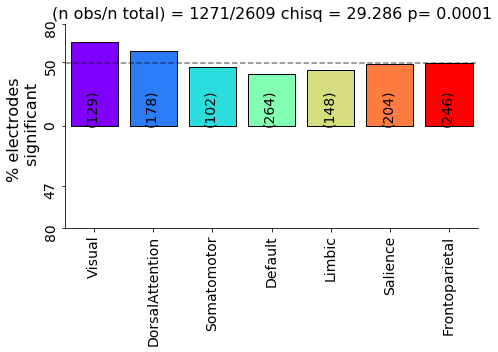

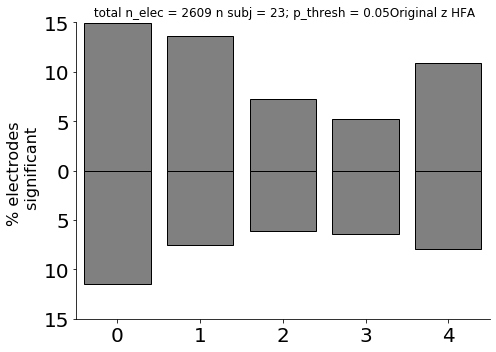

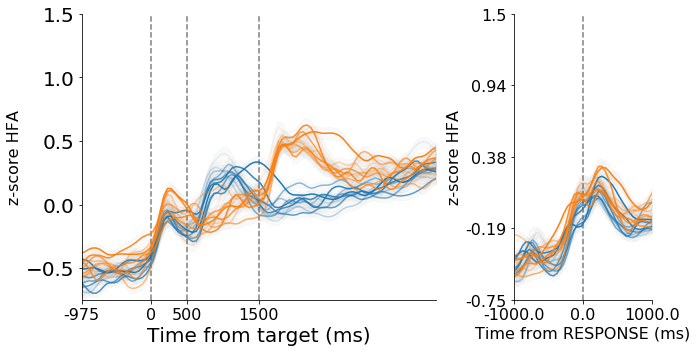

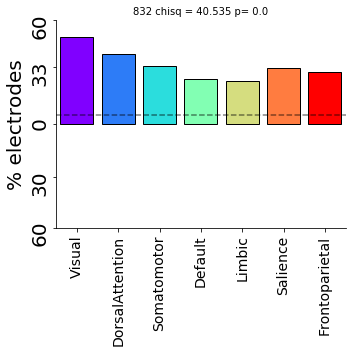

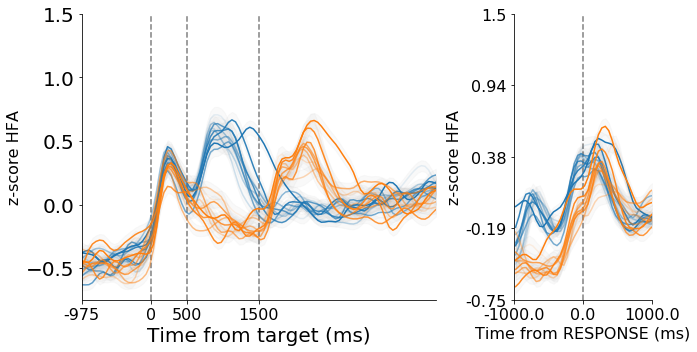

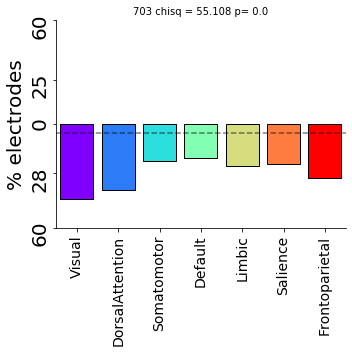

In [7]:
p_thresh=0.05
n_feat_list = ['S0c','postCC','postCC_bur','preResponse_bur','preResponse']

# any delay-related change
ret_idx_pos = np.zeros(len(C.taskstats2d_df)).astype('bool')
ret_idx_neg = np.zeros(len(C.taskstats2d_df)).astype('bool')

for n in n_feat_list:
    is_sig = (C.taskstats2d_df['delayDiff_'+n+'_pvalnp'].to_numpy()<p_thresh)
    is_pos = C.taskstats2d_df['delayDiff_'+n+'_zstatnp'].to_numpy()>0
    is_neg = C.taskstats2d_df['delayDiff_'+n+'_zstatnp'].to_numpy()<0
    ret_idx_pos =  ret_idx_pos|(is_sig&is_pos)
    ret_idx_neg =  ret_idx_neg|(is_sig&is_neg)

yL = (-.75,1.5)
plot_dict_pos = evalClus_wrapper(ret_idx_pos,beh_feat=beh_feat,yL = yL,lbl='delay-ANY-posCorr-',atlas=atlas,anat_yL=(-60,60))
print('\n')
print('Delay - Pos Corr; uncorrected p values')
print(np.sum(plot_dict_pos['counts_thisClusInReg']))

# print stats: regions with more freqent rt repressentations by chance?
p_list = []

for r in plot_dict_pos['roi_list']:
    r_idx = plot_dict_pos['roi_list'].index(r)
    tot = plot_dict_pos['counts_numInReg'][r_idx]
    obs =  plot_dict_pos['counts_thisClusInReg'][r_idx]
    chisq,p = stats.chisquare(f_obs=(obs,tot-obs), \
                                  f_exp=((0.05*tot),0.95*tot))   
    print(r,obs,'/',tot,np.round(100*(obs/tot),2),'%',' p = ',np.round(p,3))
    p_list.append(p)

plot_dict_neg =evalClus_wrapper(ret_idx_neg,beh_feat=beh_feat,yL = yL,lbl='delay-ANY-negCorr-',atlas=atlas,inv_anat_yaxis=True,anat_yL=(-60,60))
print('\n')
print('Delay - Neg Corr; uncorrected p values')
print(np.sum(plot_dict_neg['counts_thisClusInReg']))
# print stats: regions with more freqent rt repressentations by chance?
p_list = []


for r in plot_dict_neg['roi_list']:
    r_idx = plot_dict_neg['roi_list'].index(r)
    tot = plot_dict_neg['counts_numInReg'][r_idx]
    obs =  plot_dict_neg['counts_thisClusInReg'][r_idx]
    chisq,p = stats.chisquare(f_obs=(obs,tot-obs), \
                                  f_exp=((0.05*tot),0.95*tot))   
    print(r,obs,'/',tot,np.round(100*(obs/tot),2),'%',' p = ',np.round(p,3))
    p_list.append(p)
    
# compare rates of pos and neg
print('\n')
print('Pos v Corr; uncorrected p values')
# print stats: regions with more freqent rt repressentations by chance?
p_list = []
stats_table = []
for r in plot_dict_neg['roi_list']:
    r_idx = plot_dict_neg['roi_list'].index(r)
    obs_pos = plot_dict_pos['counts_thisClusInReg'][r_idx]
    obs_neg =  plot_dict_neg['counts_thisClusInReg'][r_idx]
    chisq,p = stats.chisquare(f_obs=(obs_pos,obs_neg), \
                                  f_exp=None) # equal rates expected
    print(r,obs_pos,'vs',obs_neg,np.round(100*(obs/tot),2),'%',' p = ',np.round(p,3))
    p_list.append(p)
    
    # stats dict
    stats_dict = {}
    stats_dict['roi'] = r
    stats_dict['obs_pos'] = obs_pos
    stats_dict['obs_neg'] = obs_neg
    stats_dict['chiSq_PosVNeg'] = np.round(chisq,2)
    stats_dict['p_posVNeg'] = np.round(p,2)
    
    stats_table.append(stats_dict)
# print stats table to file
stats_df = pd.DataFrame(stats_table)

#FDR correction
pvals_corrected = fdr_wrapper(p_list,plot_dict_neg['roi_list'])

# update df with corrected p-values
stats_df.insert(len(stats_df.columns),'p_posVNeg_corr',np.round(pvals_corrected,2))
#save table
stats_df.to_csv(fig_dir+'DelayByRegion_posVNeg-'+atlas+'.csv')

#### Cluster electrodes by shared specific delay-related differences

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

Visual 45 vs 20 52.58 %  p =  0.002
DorsalAttention 41 vs 23 33.66 %  p =  0.024
Somatomotor 27 vs 12 46.58 %  p =  0.016
Default 51 vs 42 15.69 %  p =  0.351
Limbic 38 vs 17 30.54 %  p =  0.005
Salience 41 vs 43 24.52 %  p =  0.827
Frontoparietal 38 vs 47 20.69 %  p =  0.329


FDR-corrected p values
[['Visual' '0.014']
 ['DorsalAttention' '0.043']
 ['Somatomotor' '0.038']
 ['Default' '0.409']
 ['Limbic' '0.016']
 ['Salience' '0.827']
 ['Frontoparietal' '0.409']]


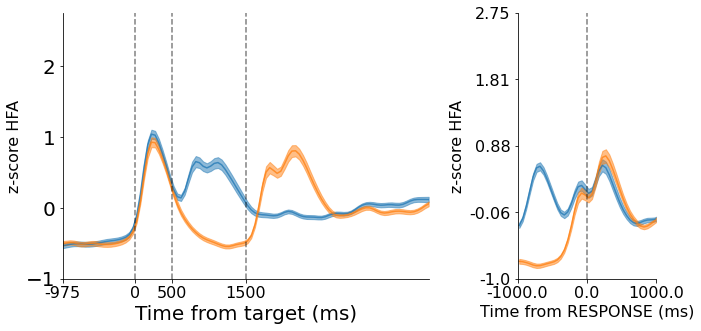

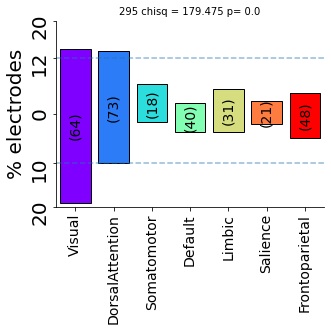

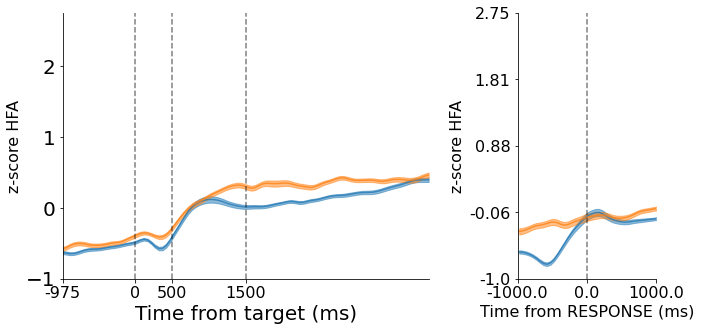

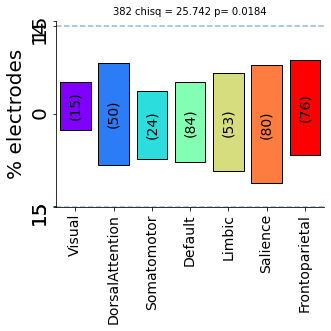

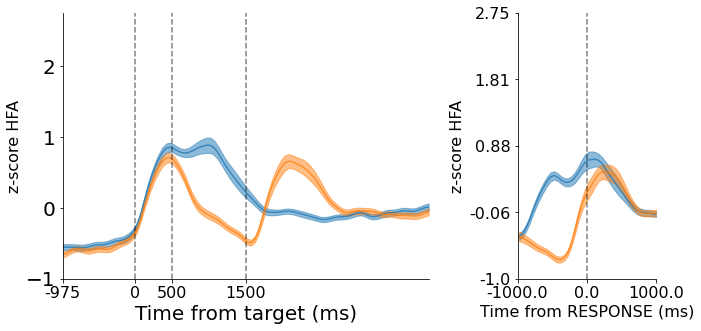

...

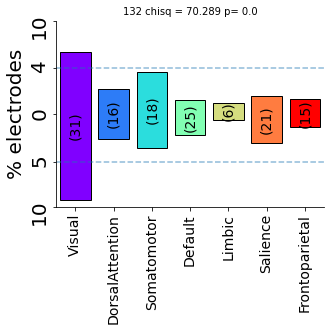

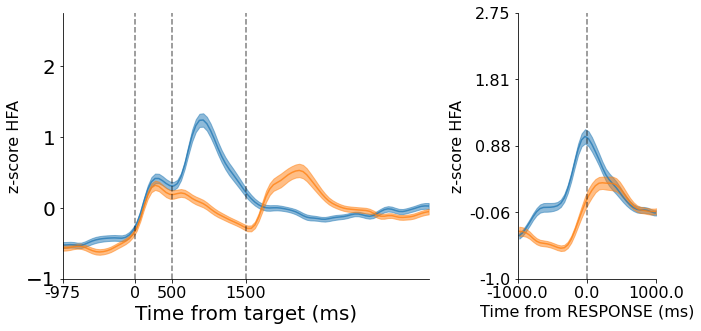

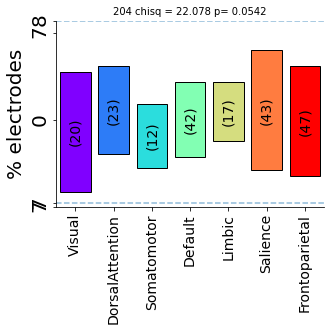

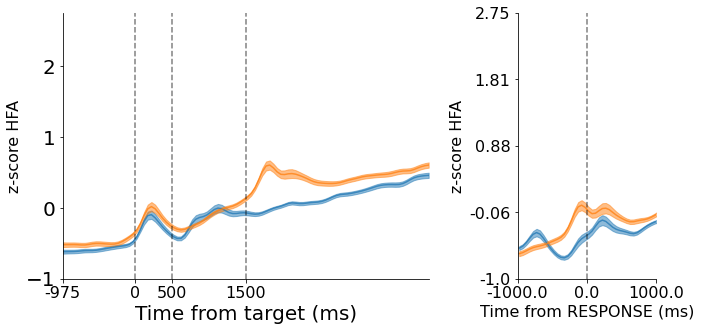

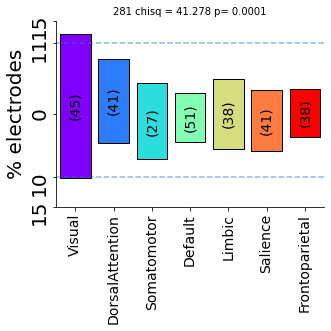

In [14]:
# plot anatomy bar plots and activation functions by specific features
p_thresh=0.05
n_feat_list = ['S0c','postCC','postCC_bur','preResponse_bur','preResponse']

for n in n_feat_list:
    is_neg = C.taskstats2d_df['delayDiff_'+n+'_zstatnp'].to_numpy()<0
    is_pos = C.taskstats2d_df['delayDiff_'+n+'_zstatnp'].to_numpy()>0
    ret_idx = C.taskstats2d_df['delayDiff_'+n+'_pvalnp'].to_numpy()<p_thresh
    
    
    # parse neu feat (for xSubj correlation w bias parameter)
    if n =='S0f':
        neu_feat = 'postCC'
    else:
        neu_feat = 'postCC'
    
    # (-) effects
    plot_dict_neg = evalClus_wrapper(ret_idx&is_neg,beh_feat=beh_feat,neu_feat = neu_feat,lbl='delayDiff-'+n+'-negCorr-',binByRT=False,show_false_alarms=False,atlas=atlas)
    #plt.gca().set_title('$\Delta_{delay}$ '+n+' (-)')

    # (+) effects
    plot_dict_pos = evalClus_wrapper(ret_idx&is_pos,beh_feat=beh_feat,neu_feat = neu_feat,lbl='delayDiff-'+n+'-posCorr-',binByRT=False,show_false_alarms=False,atlas=atlas)
    #plt.gca().set_title('$\Delta_{delay}$ '+n+' (+)')
    
    
# print stats: regions with more freqent rt repressentations by chance?
p_list = []
stats_table = []
for r in plot_dict_neg['roi_list']:
    r_idx = plot_dict_neg['roi_list'].index(r)
    tot = plot_dict_pos['counts_numInReg'][r_idx]
    obs_pos = plot_dict_pos['counts_thisClusInReg'][r_idx]
    obs_neg =  plot_dict_neg['counts_thisClusInReg'][r_idx]
    chisq,p = stats.chisquare(f_obs=(obs_pos,obs_neg), \
                                  f_exp=None) # equal rates expected
    print(r,obs_pos,'vs',obs_neg,np.round(100*(obs/tot),2),'%',' p = ',np.round(p,3))
    p_list.append(p)
    
    # stats dict
    stats_dict = {}
    stats_dict['roi'] = r
    stats_dict['tot'] = tot
    stats_dict['obs_pos'] = obs_pos
    stats_dict['obs_neg'] = obs_neg
    stats_dict['chiSq_PosVNeg'] = np.round(chisq,2)
    stats_dict['p_posVNeg'] = np.round(p,2)
    
    stats_table.append(stats_dict)
# print stats table to file
stats_df = pd.DataFrame(stats_table)

#FDR correction
pvals_corrected = fdr_wrapper(p_list,plot_dict_pos['roi_list'])

# update df with corrected p-values
stats_df.insert(len(stats_df.columns),'p_posVNeg_corr',np.round(pvals_corrected,2))
#save table
stats_df.to_csv(fig_dir+'delayByRegion_posVNeg.csv')    




#### Clustering electrodes by response dynamics

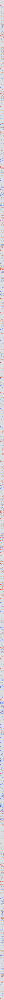

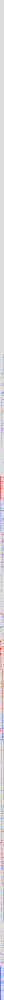

In [9]:
# illustrate feature matrix (raw and clustered)
f = plt.figure(figsize=(5,500))
#ax = plt.subplot(111)
plt.imshow(C.clus_featMat,cmap='coolwarm')
plt.gca().axis('off')
plt.tight_layout()
save_fig('feat_mat_unsorted')


cut_level=21
featMat_sorted = C.clus_featMat[np.argsort(C.clus_cut_tree[:,cut_level])]
f = plt.figure(figsize=(5,500))
#ax = plt.subplot(111)
plt.imshow(featMat_sorted,cmap='coolwarm')
plt.gca().axis('off')
save_fig('feat_mat_sorted_'+str(cut_level))

In [5]:
# plot number of "reproducible" clusters as a function of cluster level
cut_levels_to_test = np.arange(0,100,1)
num_clus_by_level = np.zeros(len(cut_levels_to_test))
count=-1
for cut_level in cut_levels_to_test:
    count+=1
    num_clus_by_level[count] = get_num_generalized_clusters(cut_level = cut_level,min_subj = 5, min_elec=50)
    #print(cut_level)
    

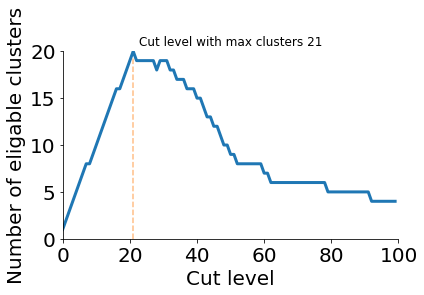

In [7]:
f = plt.figure()   
ax = plt.subplot(111)
ax.plot(cut_levels_to_test,num_clus_by_level,linewidth=3)
ax.set_ylabel('Number of eligable clusters')
ax.set_xlabel('Cut level')
ax.vlines(cut_levels_to_test[np.argmax(num_clus_by_level)],ax.get_ylim()[0],\
          ax.get_ylim()[1],linestyle='--',color='C1',alpha=0.5)
ax.set_title('Cut level with max clusters '+str(cut_levels_to_test[np.argmax(num_clus_by_level)]))
save_fig('optimal_clus_level')

cut_level = cut_levels_to_test[np.argmax(num_clus_by_level)]
    

In [8]:
num_clus_by_level

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 12.,
       12., 13., 13., 13., 13., 12., 12., 12., 13., 13., 13., 13., 12.,
       12., 12., 12., 12., 12., 11., 11., 11., 11., 11., 11., 11., 11.,
       11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11.,
       11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11.,
       11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11.,
       11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11., 11.,
       11., 11., 11., 11., 11., 11., 11., 11., 11.])

Text(0.5, 1.0, 'db...99')

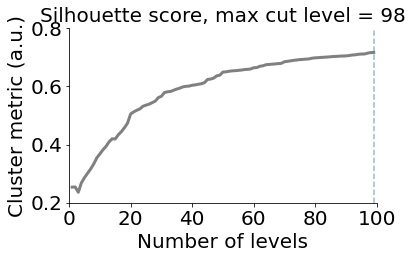

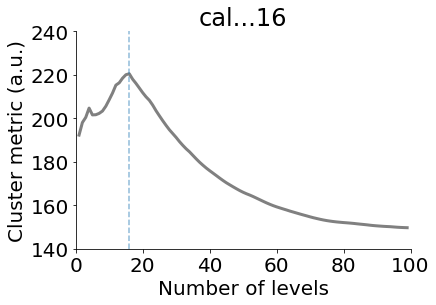

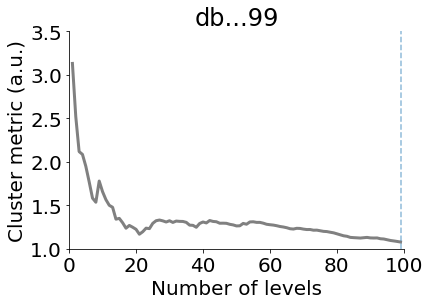

In [16]:
C.clus_plotMetric(metric_lbl='sil')
plt.gca().vlines(np.argmax(C.clus_sil_score[1:])+1,plt.gca().get_ylim()[0],plt.gca().get_ylim()[1],\
                 linestyle='dashed',alpha=0.5)
plt.gca().set_title([])
plt.gca().set_title
plt.gca().set_title('Silhouette score, max cut level = '+str(np.argmax(C.clus_sil_score[1:])),fontsize=20)
save_fig('silhouette_score')

C.clus_plotMetric(metric_lbl='cal')
plt.gca().vlines(np.argmax(C.clus_cal_score[1:])+1,plt.gca().get_ylim()[0],plt.gca().get_ylim()[1],\
                 linestyle='dashed',alpha=0.5)
plt.gca().set_title(plt.gca().get_title()+'...'+str(np.argmax(C.clus_cal_score[1:])+1))


C.clus_plotMetric(metric_lbl='db')
plt.gca().vlines(np.argmin(C.clus_db_score[1:])+1,plt.gca().get_ylim()[0],plt.gca().get_ylim()[1],\
                 linestyle='dashed',alpha=0.5)
plt.gca().set_title(plt.gca().get_title()+'...'+str(np.argmin(C.clus_db_score[1:])+1))

In [6]:
%%capture
# set cluster level
cut_level = 21
#cut_level=12 # rtOnly 
#cut_level=14 # delay only
#cut_level=19 # selectivity_anat
#cut_level=28 # selec only; only select regions (visual, somatomotor, salience, limbic)


# basic descriptions of each cluster's properties
postTarg_dict = C.evalClusLevel_activationAmplitude(cut_level = cut_level, figsize=(10,5),neu_feat = 'postTargOn');
preResp_dict = C.evalClusLevel_activationAmplitude(cut_level = cut_level, figsize=(10,5),neu_feat = 'preResponseL_respLocked');
postResp_dict = C.evalClusLevel_activationAmplitude(cut_level = cut_level, figsize=(10,5),neu_feat = 'postResponseL_respLocked');
anat_dict = C.evalClusLevel_anatLocalization(cut_level = cut_level)

# compute clus level data (data across all clusters), but dont plot it
rt_dict = C.evalClusLevel_rtRegressCounts_SSE(cut_level = cut_level, beh_feat = beh_feat,figsize=(10,5))


# Specific RT (features)
rt_dict_s0f = C.evalClusLevel_rtCorrCounts(cut_level = cut_level, \
                                         neu_feat='S0f', use_clean = True, beh_feat = beh_feat)
rt_dict_s0c = C.evalClusLevel_rtCorrCounts(cut_level = cut_level, \
                                         neu_feat='S0c', use_clean = True, beh_feat = beh_feat)
rt_dict_postCC = C.evalClusLevel_rtCorrCounts(cut_level = cut_level, \
                                         neu_feat='postCC', use_clean = True, beh_feat = beh_feat)
rt_dict_postCC_bur = C.evalClusLevel_rtCorrCounts(cut_level = cut_level, \
                                         neu_feat='postCC_bur', use_clean = True, beh_feat = beh_feat)
rt_dict_preResponse_bur = C.evalClusLevel_rtCorrCounts(cut_level = cut_level, \
                                         neu_feat='preResponse_bur', use_clean = True, beh_feat = beh_feat)
rt_dict_preResponse = C.evalClusLevel_rtCorrCounts(cut_level = cut_level, \
                                         neu_feat='preResponse', use_clean = True, beh_feat = beh_feat)

# DELAY Diff by feature
delay_dict_s0c = C.evalClusLevel_delayDiffCounts(cut_level = cut_level, figsize=(10,5),neu_feat = 'S0c',use_clean=True);
delay_dict_postCC = C.evalClusLevel_delayDiffCounts(cut_level = cut_level, figsize=(10,5),neu_feat = 'postCC',use_clean=True);
delay_dict_postCC_bur = C.evalClusLevel_delayDiffCounts(cut_level = cut_level, figsize=(10,5),neu_feat = 'postCC_bur',use_clean=True);
delay_dict_preResponse_bur = C.evalClusLevel_delayDiffCounts(cut_level = cut_level, figsize=(10,5),neu_feat = 'preResponse_bur',use_clean=True);
delay_dict_preResponse = C.evalClusLevel_delayDiffCounts(cut_level = cut_level, figsize=(10,5),neu_feat = 'preResponse',use_clean=True);


# Features not used in clustering 

# delay-related change in pre resp buildup rate by anticipation bias (subject-wise comparison)
bias_dict = C.evalClusLevel_xSubjCorr_delayDiff(cut_level = cut_level, beh_xSubj = 'paramsDiff_B', \
                                       neu_feat='preResponse_bur', use_clean = False,do_ttest=True,subj_grp_query='paramsDiff_B>0.1')    
# delay-related change in pre resp buildup rate by sensitivity (subject-wise comparison)
sens_dict = C.evalClusLevel_xSubjCorr_delayDiff(cut_level = cut_level, beh_xSubj = 'paramsDiff_S', \
                                       neu_feat='preResponse_bur', use_clean = False,do_ttest=True,subj_grp_query='paramsDiff_S>0')    

# pre-stimulus correlation of prediction times (expecation representation/integration)

pt_dict_s0f = C.evalClusLevel_selectivityCounts(cut_level=cut_level,sel_feat = 'ptCorr_S0f')
pt_dict = C.evalClusLevel_selectivityCounts(cut_level=cut_level,sel_feat = 'ptCorr_postTarg')
# change in post response activity on error trials (prediction error)
err_dict = C.evalClusLevel_selectivityCounts(cut_level=cut_level,sel_feat = 'errSel')
# Spatial selectivity
spatial_dict = C.evalClusLevel_selectivityCounts(cut_level=cut_level,sel_feat = 'spatialSel')
# reward selectivity
rew_dict = C.evalClusLevel_selectivityCounts(cut_level=cut_level,sel_feat = 'rewSel')


# OTHERS:
#preRespTiming_dict = C.evalClusLevel_activationTiming(cut_level = cut_level, figsize=(10,5), neu_feat = 'preResponseL_respLocked')
#postTargTiming_dict = C.evalClusLevel_activationTiming(cut_level = cut_level, figsize=(10,5), neu_feat = 'postResponseL_respLocked')

# pre-stimulus neural activity difference between premature responses vs. correct responses
#tooFast_dict = C.evalClusLevel_selectivityCounts(cut_level=cut_level,sel_feat = 'tooFastSel')


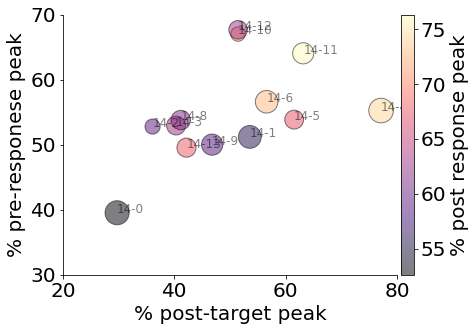

In [10]:
alpha = 0.5
figsize = (7,5)
text_offset_x =0
text_offset_y = 0
xL=(10,80)
anat_scale = 20
#
# Descriptive
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*anat_scale,color=postResp_dict['freq']*100,cmap='magma',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(xL)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post-target peak')
plt.gca().set_ylabel('% pre-responese peak')
plt.colorbar(fraction=0.05,pad=.01,label='% post response peak')
save_fig('cut_level'+str(cut_level)+'-SCATTER-timeCourseSummary')

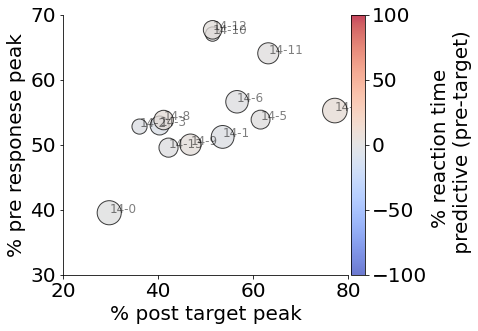

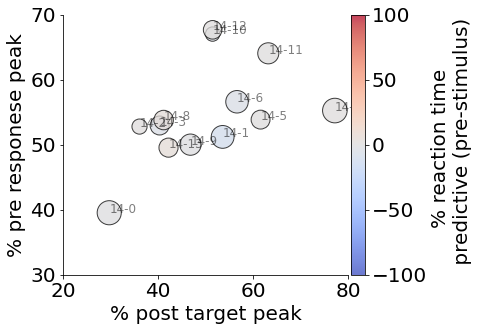

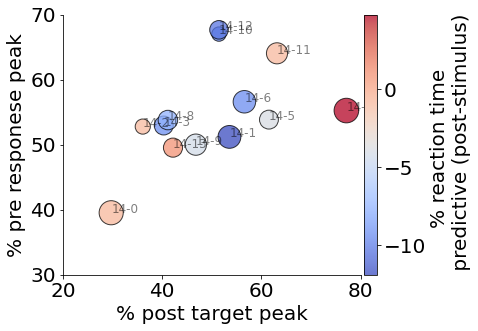

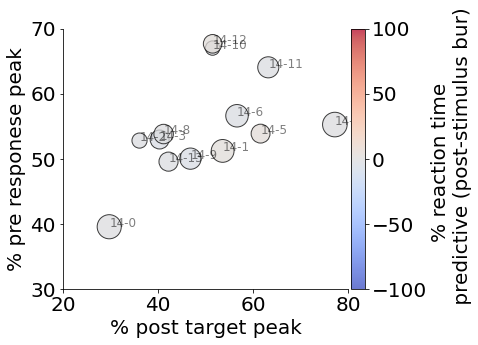

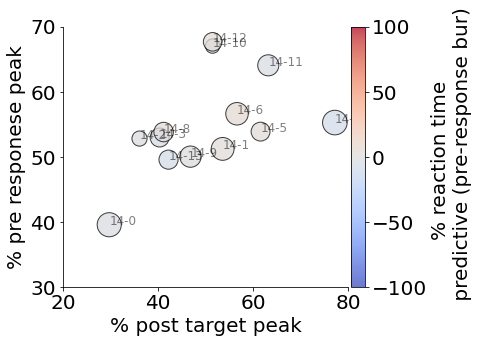

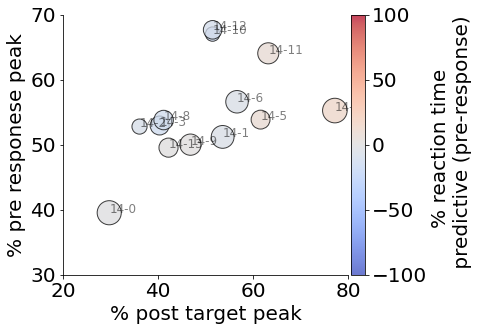

In [11]:
# Specific RT features
alpha = 0.75
figsize = (7,5)
text_offset_x = 0
text_offset_y = 0

# RT_corr S0f
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=rt_dict_s0f['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-100,100)
plt.colorbar(fraction=0.05,pad=.01,label='% reaction time \n predictive (pre-target)')
save_fig('cut_level'+str(cut_level)+'-SCATTER-rtPred-S0f')

# RT_corr S0c
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=rt_dict_s0c['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-100,100)
plt.colorbar(fraction=0.05,pad=.01,label='% reaction time \n predictive (pre-stimulus)')
save_fig('cut_level'+str(cut_level)+'-SCATTER-rtPred-S0c')


# RT_corr postCC
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=rt_dict_postCC['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.colorbar(fraction=0.05,pad=.01,label='% reaction time \n predictive (post-stimulus)')
save_fig('cut_level'+str(cut_level)+'-SCATTER-rtPred-postCC')


# RT_corr postCC_bur
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=rt_dict_postCC_bur['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-100,100)
plt.colorbar(fraction=0.05,pad=.01,label='% reaction time \n predictive (post-stimulus bur)')
save_fig('cut_level'+str(cut_level)+'-SCATTER-rtPred-postCC_bur')


# RT_corr preResponse_bur
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=rt_dict_preResponse_bur['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-100,100)
plt.colorbar(fraction=0.05,pad=.01,label='% reaction time \n predictive (pre-response bur)')
save_fig('cut_level'+str(cut_level)+'-SCATTER-rtPred-preResponse_bur')


# RT_corr preResponse
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=rt_dict_preResponse['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-100,100)
plt.colorbar(fraction=0.05,pad=.01,label='% reaction time \n predictive (pre-response)')
save_fig('cut_level'+str(cut_level)+'-SCATTER-rtPred-preResponse')

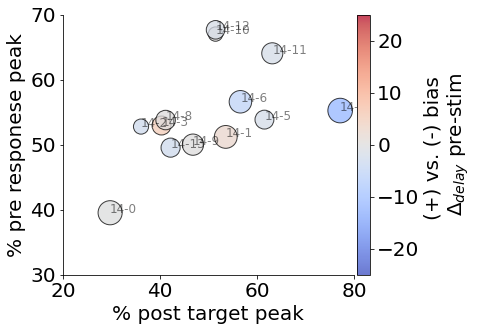

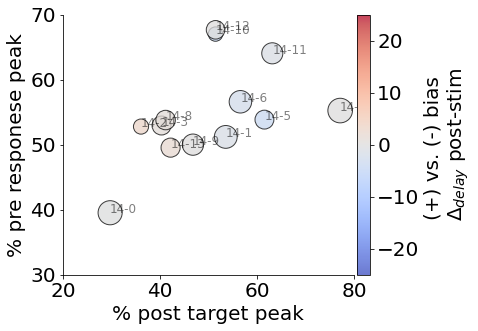

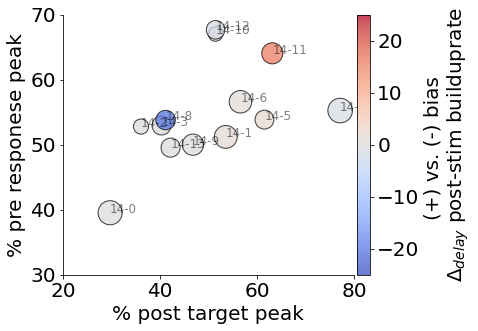

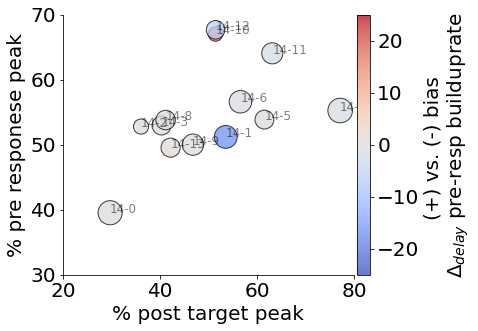

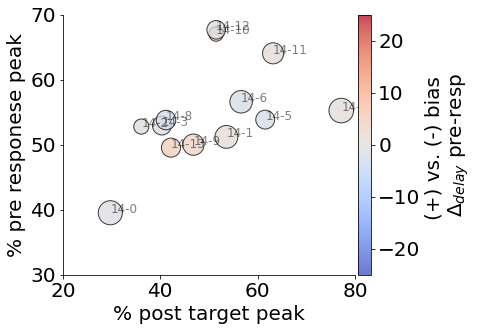

In [12]:
# Specific delay-diff features
alpha = 0.75
figsize = (7,5)
text_offset_x = 0
text_offset_y = 0

# delay-diff S0c
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=delay_dict_s0c['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-25,25)
plt.colorbar(fraction=0.05,pad=.01,label='(+) vs. (-) bias \n$\Delta_{delay}$ pre-stim')
save_fig('cut_level'+str(cut_level)+'-SCATTER-delayDiff-S0c')


# delayDiff postCC
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=delay_dict_postCC['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-25,25)
plt.colorbar(fraction=0.05,pad=.01,label='(+) vs. (-) bias \n$\Delta_{delay}$ post-stim')
save_fig('cut_level'+str(cut_level)+'-SCATTER-delayDiff-postCC')


# delayDiff postCC_bur
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=delay_dict_postCC_bur['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-25,25)
plt.colorbar(fraction=0.05,pad=.01,label='(+) vs. (-) bias \n$\Delta_{delay}$ post-stim builduprate')
save_fig('cut_level'+str(cut_level)+'-SCATTER-delayDiff-postCC_bur')


# delayDiff preResponse_bur
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=delay_dict_preResponse_bur['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-25,25)
plt.colorbar(fraction=0.05,pad=.01,label='(+) vs. (-) bias \n$\Delta_{delay}$ pre-resp builduprate')
save_fig('cut_level'+str(cut_level)+'-SCATTER-delayDiff-preResponse_bur')


# delayDiff preResponse
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*20,color=delay_dict_preResponse['freq_PosNegDiff']*100,cmap='coolwarm',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(-5,115)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post target peak')
plt.gca().set_ylabel('% pre responese peak')
plt.clim(-25,25)
plt.colorbar(fraction=0.05,pad=.01,label='(+) vs. (-) bias \n$\Delta_{delay}$ pre-resp')
save_fig('cut_level'+str(cut_level)+'-SCATTER-delayDiff-preResponse')

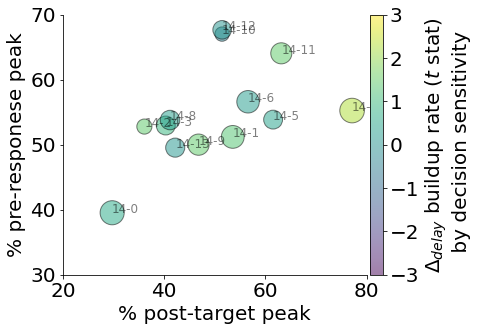

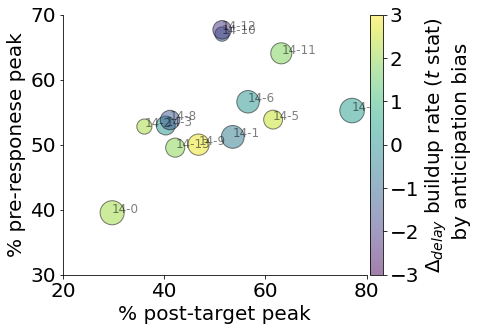

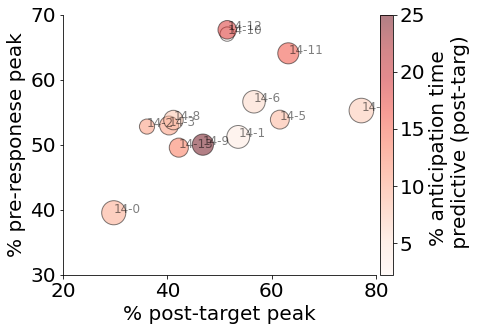

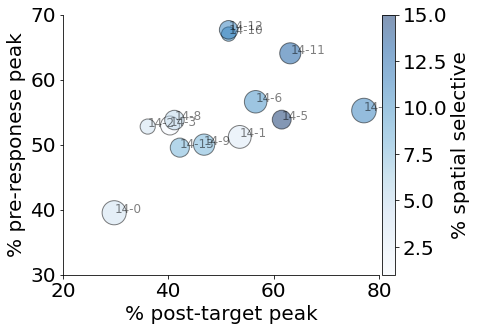

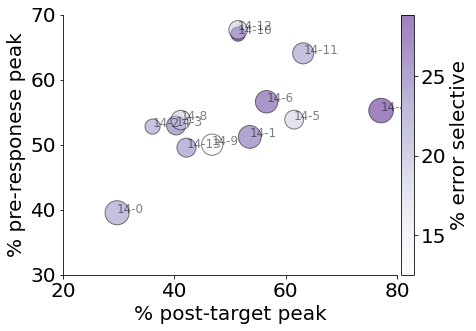

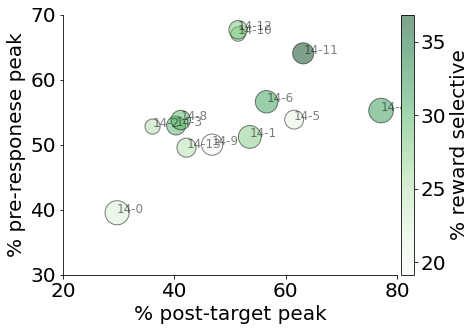

In [13]:
alpha = 0.5
figsize = (7,5)
text_offset_x =0
text_offset_y = 0
xL=(10,80)
anat_scale = 20
# Independent features
# # PT predictive
# C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
#                s=anat_dict['chi2stats']*anat_scale,color=rt_dict['freq']*100,cmap='Greens',\
#                plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
#                text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

# #plt.gca().set_xlim(xL)
# #plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
# plt.gca().set_xlabel('% post target peak')
# plt.gca().set_ylabel('% pre responese peak')
# plt.colorbar(fraction=0.05,pad=.01,label='% reaction time \n predictive')
# save_fig('cut_level'+str(cut_level)+'-SCATTER-ptPred')




# sensitivity predictive (preResp bur )
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*anat_scale,color=sens_dict['tstat'],cmap='viridis',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(xL)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post-target peak')
plt.gca().set_ylabel('% pre-responese peak')
plt.clim(-3,3)
plt.colorbar(fraction=0.05,pad=.01,label='$\Delta_{delay}$ buildup rate ($t$ stat)\n by decision sensitivity')
save_fig('cut_level'+str(cut_level)+'-SCATTER-sensPredxSubj')



# bias predictive (preResp bur )
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*anat_scale,color=bias_dict['tstat'],cmap='viridis',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(xL)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post-target peak')
plt.gca().set_ylabel('% pre-responese peak')
plt.clim(-3,3)
plt.colorbar(fraction=0.05,pad=.01,label='$\Delta_{delay}$ buildup rate ($t$ stat)\n by anticipation bias')
save_fig('cut_level'+str(cut_level)+'-SCATTER-biasPredxSubj')


# # PT predictive (pre-stim)
# C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
#                s=anat_dict['chi2stats']*anat_scale,color=pt_dict_s0f['freq']*100,cmap='Greens',\
#                plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
#                text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

# #plt.gca().set_xlim(xL)
# #plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
# plt.gca().set_xlabel('% post target peak')
# plt.gca().set_ylabel('% pre responese peak')
# plt.colorbar(fraction=0.05,pad=.01,label='% anticipation time \n predictive (pre-stim)')
# save_fig('cut_level'+str(cut_level)+'-SCATTER-ptPred_S0f')


# PT predictive (post-targ)
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*anat_scale,color=pt_dict['freq']*100,cmap='Reds',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(xL)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post-target peak')
plt.gca().set_ylabel('% pre-responese peak')
plt.colorbar(fraction=0.05,pad=.01,label='% anticipation time \n predictive (post-targ)')
save_fig('cut_level'+str(cut_level)+'-SCATTER-ptPred')



# spatial selective
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*anat_scale,color=np.array(spatial_dict['freq']*100).astype('int'),cmap='Blues',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(xL)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post-target peak')
plt.gca().set_ylabel('% pre-responese peak')
plt.colorbar(fraction=0.05,pad=.01,label='% spatial selective')
save_fig('cut_level'+str(cut_level)+'-SCATTER-spatialSel')


# error_sel
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*anat_scale,color=err_dict['freq']*100,cmap='Purples',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(xL)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post-target peak')
plt.gca().set_ylabel('% pre-responese peak')
plt.colorbar(fraction=0.05,pad=.01,label='% error selective')
save_fig('cut_level'+str(cut_level)+'-SCATTER-errorSel')


# rew_sel
C.plot_scatter(postTarg_dict['freq']*100,preResp_dict['freq']*100,\
               s=anat_dict['chi2stats']*anat_scale,color=rew_dict['freq']*100,cmap='Greens',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,\
               text_offset_x = text_offset_x,text_offset_y = text_offset_y, figsize=figsize)

#plt.gca().set_xlim(xL)
#plt.gca().set_ylim(-5,plt.gca().get_ylim()[1])
plt.gca().set_xlabel('% post-target peak')
plt.gca().set_ylabel('% pre-responese peak')
plt.colorbar(fraction=0.05,pad=.01,label='% reward selective')
save_fig('cut_level'+str(cut_level)+'-SCATTER-rewSel')

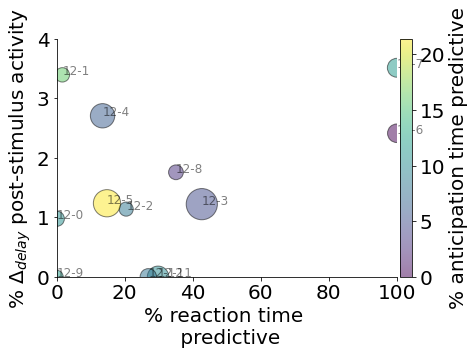

In [12]:
# Reaciton time (postCC)vs. Prediction time representations

alpha = 0.5
figsize = (7,5)
anat_scale = 20

# RT correlation vs. delay diff vs. anticipation predictive
C.plot_scatter(rt_dict_postCC['freq']*100,delay_dict_postCC['freq']*100,\
               s=anat_dict['chi2stats']*anat_scale,color=pt_dict['freq']*100,cmap='viridis',\
               plotLine=False,text_lbls=np.array(rt_dict['lbls']),alpha=alpha,figsize=figsize)
#plt.gca().set_xlim(-5,80)
#plt.gca().set_ylim(-2,40)
plt.gca().set_xlabel('% reaction time \n predictive')
plt.gca().set_ylabel('% $\Delta_{delay}$ post-stimulus activity')
plt.colorbar(fraction=0.05,pad=.01,label='% anticipation time predictive')
plt.tight_layout()
#plt.clim(0,0.6)
save_fig('scatter_rt_delay_anticipation')

No handles with labels found to put in legend.
No handles with labels found to put in legend.




clus id 0 n elec =  924 n subj =  23


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11626: RuntimeWarning: invalid value encountered in less
  finger_sel_obsInClus.append(



clus id 1 n elec =  48 n subj =  19


clus id 2 n elec =  71 n subj =  19


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11626: RuntimeWarning: invalid value encountered in less
  finger_sel_obsInClus.append(



clus id 3 n elec =  120 n subj =  23


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11626: RuntimeWarning: invalid value encountered in less
  finger_sel_obsInClus.append(



clus id 4 n elec =  79 n subj =  21


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11626: RuntimeWarning: invalid value encountered in less
  finger_sel_obsInClus.append(



clus id 5 n elec =  58 n subj =  19


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11620: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11626: RuntimeWarning: invalid value encountered in less
  finger_sel_obsInClus.append(



clus id 6 n elec =  87 n subj =  19


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 7 n elec =  105 n subj =  22


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 8 n elec =  104 n subj =  19


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 9 n elec =  75 n subj =  21


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 10 n elec =  76 n subj =  19


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 11 n elec =  112 n subj =  21


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 12 n elec =  75 n subj =  18


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 13 n elec =  153 n subj =  23


No handles with labels found to put in legend.
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pv



clus id 14 n elec =  71 n subj =  18


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 15 n elec =  56 n subj =  20


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 16 n elec =  54 n subj =  19


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 17 n elec =  54 n subj =  18


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 18 n elec =  82 n subj =  22


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 19 n elec =  72 n subj =  21


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



clus id 20 n elec =  44 n subj =  17


clus id 21 n elec =  89 n subj =  18


/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:12122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=fsize)
/Users/ashwinramayya/anaconda3/envs/environment_name/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11619: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/



FDR-corrected p values
[['21-0' '0.033']
 ['21-2' '0.516']
 ['21-3' '0.305']
 ['21-4' '0.256']
 ['21-5' '0.516']
 ['21-6' '0.0']
 ['21-7' '0.009']
 ['21-8' '0.189']
 ['21-9' '0.004']
 ['21-10' '0.256']
 ['21-11' '0.516']
 ['21-12' '0.553']
 ['21-13' '0.189']
 ['21-14' '0.516']
 ['21-15' '0.256']
 ['21-16' '0.754']
 ['21-17' '0.795']
 ['21-18' '0.16']
 ['21-19' '0.925']
 ['21-21' '0.516']]


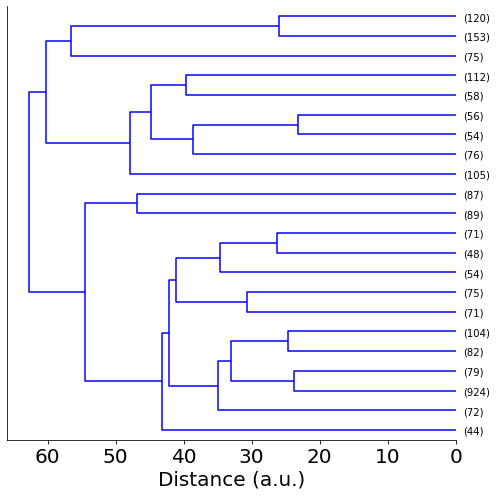

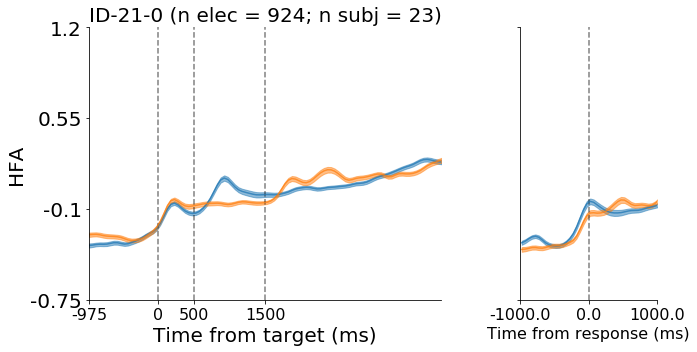

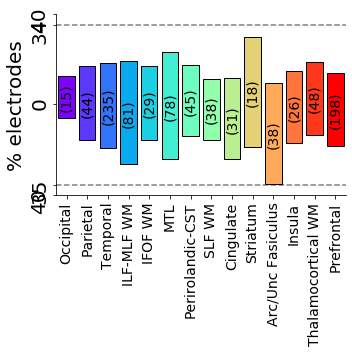

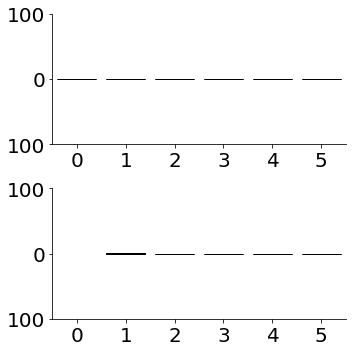

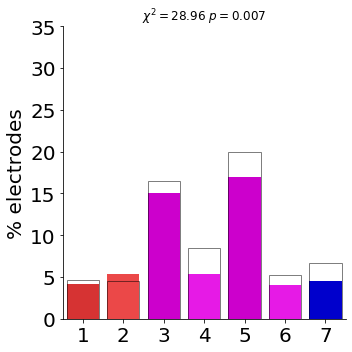

...

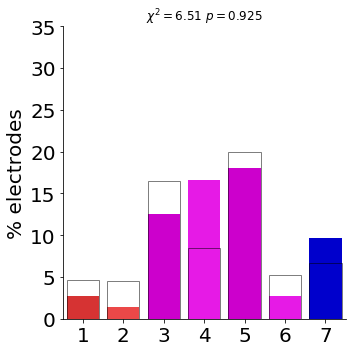

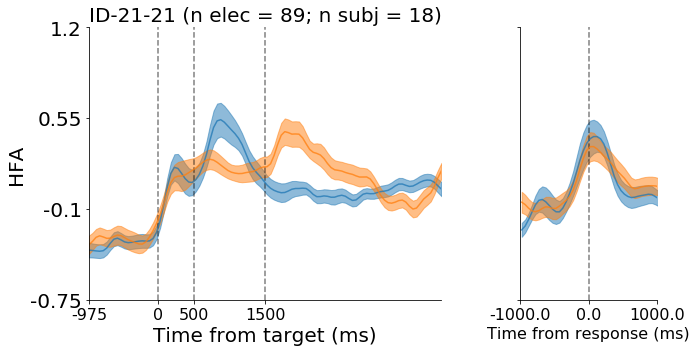

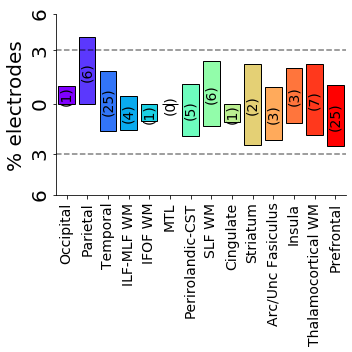

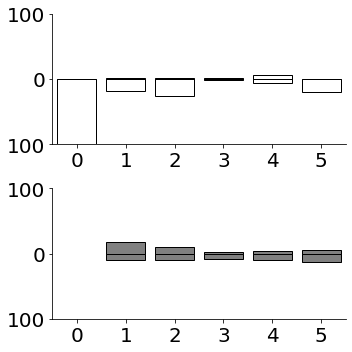

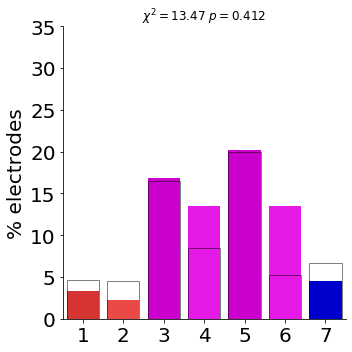

In [13]:
#NOTE: Cut level = 11 actually gives you 12 clusters
min_subj = 5
min_elec = 50
p_list,lbl_list,stats_df = explore_level(cut_level=cut_level,beh_feat = beh_feat,yL = (-0.75,1.2),atlas='default',min_subj = min_subj, min_elec=min_elec)
pvals_corrected = fdr_wrapper(p_list,lbl_list)

# update df with corrected p-values
stats_df.insert(len(stats_df.columns),'p_corr',np.round(pvals_corrected,2))
#save table
stats_df.to_csv(fig_dir+'cluster_table.csv')    


In [7]:
def evalClus_wrapper2(ret_idx,yL = (-1,2.75),beh_feat = 'zrrt',neu_feat = None,lbl = None,binByRT=True,show_false_alarms = False,atlas='default'):
    # eval average activation function for a group of electrodes
    
    # calc num subj
    n_subj = np.count_nonzero(C.collapseBySubj_1d(ret_idx))
    print('\n')
    print(lbl,'n elec = ', np.count_nonzero(ret_idx), 'n subj = ',n_subj)

    # create figure
    figsize=(10,5)
    f = plt.figure(figsize=figsize,facecolor='w') 


    # create subplots and axes
    gs = f.add_gridspec(nrows=2,ncols=6)
    ax_fix = f.add_subplot(gs[:,0:4])
    ax_resp = f.add_subplot(gs[:,4:])


    # plot targ-locked power
    C.evalClus_powByRT2d(ax = ax_fix,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=binByRT)
    # plot targ error
    if show_false_alarms == True:
        C_err.evalClus_powByRT2d(ax = ax_fix,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=False,color = '0.5',alpha=0.4)
    ax_fix.legend().remove()
    ax_fix.set_xlabel('Time from target (ms)',fontsize=20)
    ax_fix.set_title('')


    # plot resp-locked power
    C2.evalClus_powByRT2d(ax=ax_resp,ret_idx = ret_idx,xL_ms=(-1000,1000),figsize=(5,5),yL=yL,binByRT=binByRT)
    # plot resp error
    if show_false_alarms == True:
        C2_err.evalClus_powByRT2d(ax = ax_resp,ret_idx = ret_idx,figsize=(7,5),yL=yL,binByRT=False,xL_ms=(-1000,1000),color = '0.5',alpha=0.4)
    ax_resp.legend().remove()
    ax_resp.set_title('')
    
    
    # save figure
    save_fig(lbl+'_actFunc')


    # plot anat - default
    atlas='default'
    anat_dict = C.evalClus_anat(ax=None,ret_idx = ret_idx,\
                    use_colormap=True, plot_by_hemis = False,\
                    yL=None,title = str(np.count_nonzero(ret_idx)),fsize=(5,5),fsize_lbl=10,atlas=atlas)
    #plt.gca().set_title('')
    #plt.gca().invert_yaxis()
    plt.gca().set_ylim((0,plt.gca().get_ylim()[-1]))
    plt.gca().set_ylabel('% electrodes',fontsize=20)
    plt.gca().set_yticklabels(plt.gca().get_yticklabels(),rotation=90,fontsize=20)
    plt.gca().hlines(100*anat_dict['prct_exp'],plt.gca().get_xlim()[0],plt.gca().get_xlim()[1],\
                     colors='k',linestyle='dashed',alpha=0.5)
    save_fig(lbl+'_anat'+'-'+atlas)


    atlas='yeo'
    anat_dict_yeo = C.evalClus_anat(ax=None,ret_idx = ret_idx,\
                    use_colormap=True, plot_by_hemis = False,\
                    yL=None,title = str(np.count_nonzero(ret_idx)),fsize=(5,5),fsize_lbl=10,atlas=atlas)
    #plt.gca().set_title('')
    #plt.gca().invert_yaxis()
    plt.gca().set_ylim((0,plt.gca().get_ylim()[-1]))
    plt.gca().set_ylabel('% electrodes',fontsize=20)
    plt.gca().set_yticklabels(plt.gca().get_yticklabels(),rotation=90,fontsize=20)
    plt.gca().hlines(100*anat_dict['prct_exp'],plt.gca().get_xlim()[0],plt.gca().get_xlim()[1],\
                     colors='k',linestyle='dashed',alpha=0.5)
    save_fig(lbl+'_anat'+'-'+atlas)
    
    
#     # plot RT- finger print
#     # create subplots and axes
#     f = plt.figure(figsize=[5,5])
#     gs = f.add_gridspec(nrows=1,ncols=2)
#     ax_rt = f.add_subplot(gs[0,0])
#     ax_delay = f.add_subplot(gs[0,1])

#     use_clean = True
#     collapseBySubj_flag = False
#     C.evalClus_rtCorrCounts_anyTime(ax=ax_rt,beh_feat=beh_feat,use_clean = use_clean,delay_str = '',ret_idx = ret_idx,yL=(-100,100))
#     #C.evalClus_rtCorrCounts(ax=ax_rt,beh_feat=beh_feat,use_clean = use_clean,delay_str = '',ret_idx = ret_idx,yL=(-100,100))
#     #ax_rt.set_xticklabels(ax_rt.get_xticks(),fontsize=20,rotation=0)
#     ax_rt.set_title('')
#     ax_rt.set_ylabel('')

#     #plot_dict = C.evalClus_delayDiffCounts(ax = ax_delay,use_clean = False, ret_idx = ret_idx,yL=(-100,100))
#     plot_dict = C.evalClus_delayDiffCounts_anyTime(ax = ax_delay,use_clean = False, ret_idx = ret_idx,yL=(-100,100))
#     #ax_delay.set_xticklabels(ax_delay.get_xticks().astype('int'),fontsize=20,rotation=0)
#     ax_delay.set_title('')
#     ax_delay.set_ylabel('')
#     save_fig(lbl+'-delayAndRt')
#     #C.evalClus_rtCorrCounts(use_clean = use_clean,delay_str = 'S',ret_idx = ret_idx,yL=(0,50))
#     #C.evalClus_rtCorrCounts(use_clean = use_clean,delay_str = 'L',ret_idx = ret_idx,yL=(0,50))

#     # plot selectivity finger print
#     counts_dict = C.evalClus_fingerprint(ax = None,ret_idx = ret_idx, \
#                            sel_feat_list = ['ptCorr_postTarg','errSel','rewSel','spatialSel'],\
#                            p_thresh=0.05,use_roiList=True,count_by_hemis = False,\
#                            count_anyChange=False,plot_option='sel',yL=[0,35],atlas=atlas)
#     plt.gca().set_xticklabels(plt.gca().get_xticks()+1,fontsize=20,rotation=0)
#     plt.gca().set_ylabel('% electrodes',fontsize=20)
#     plt.gca().set_xlim((plt.gca().get_xticks()[0]-.5,plt.gca().get_xticks()[-1]+.5))
#     plt.gca().set_title('$\chi^{2} = $'+str(np.round(counts_dict['chisq'],2))+\
#                         ' $p = $'+str(np.round(counts_dict['pval'],3)))
    #save_fig('cut_level'+str(cut_level)+'-'+str(clusid)+'-sel')

    # collect p vals and lbls
    #p_list.append(counts_dict['pval'])
    #lbl_list.append(str(cut_level)+'-'+str(clusid))

    # stats_dict
    #stats_dict={}
    #stats_dict['clusId'] = str(cut_level)+'-'+str(clusid)
    #stats_dict['n_obs'] = counts_dict['n_totInClus']
    #stats_dict['chiSq'] = np.round(counts_dict['chisq'],2)
    #stats_dict['p'] = np.round(counts_dict['pval'],2)


    # append to stats_table
    #stats_table.append(stats_dict)

    # stats df
    #stats_df = pd.DataFrame(stats_table)    
    
    # return plot_dict
    
    return anat_dict,anat_dict_yeo


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.




clus_list_a n elec =  312 n subj =  23


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.




clus_list_b n elec =  363 n subj =  23


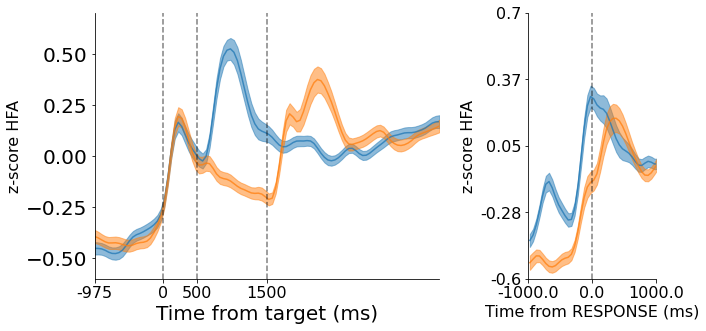

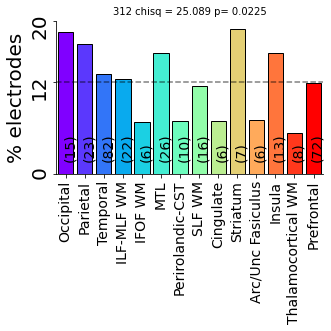

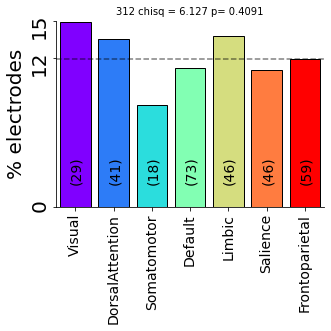

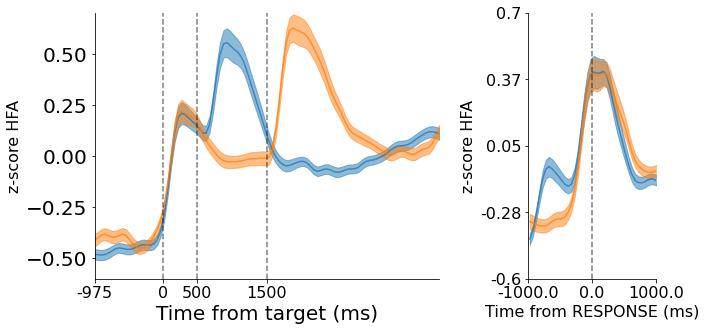

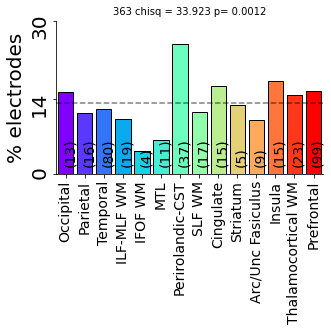

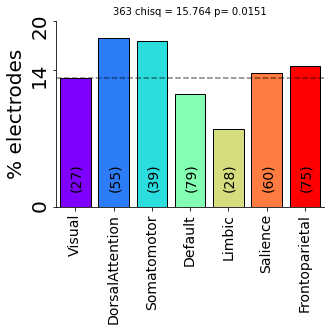

In [12]:
# Compare specific groups of clusters
min_subj = 5
min_elec = 50

# get clus_list
clus_list = C.clus_getEligibleClusters(cut_level=cut_level,\
                                       min_subj_thresh=min_subj,\
                                       min_elec_thresh=min_elec)

clus_list_a =[2,7,17,18]#
clus_list_b =[11,9,6,21] #


# any rt-related change
ret_idx_a = np.zeros(len(C.taskstats2d_df)).astype('bool')
ret_idx_b = np.zeros(len(C.taskstats2d_df)).astype('bool')

for n in clus_list:
    ret_idx = C.clus_cut_tree[:,cut_level]==n
    if n in clus_list_a:        
        ret_idx_a = ret_idx_a|ret_idx
    if n in clus_list_b:
        ret_idx_b = ret_idx_b|ret_idx
        
plot_dict_a,plot_dict_a_yeo = evalClus_wrapper2(ret_idx_a,beh_feat=beh_feat,yL = (-0.6,0.7),lbl='clus_list_a',atlas='default',binByRT = False,show_false_alarms = False)
plot_dict_b,plot_dict_b_yeo = evalClus_wrapper2(ret_idx_b,beh_feat=beh_feat,yL = (-0.6,0.7),lbl='clus_list_b',atlas='default',binByRT = False,show_false_alarms = False)


clus_list_a_vs_b_2d_anatomy
chi-square test comparing frequencies across groups
chi2 36.474938135423024
dof 13
p 0.0005005129816492118
clus_list_a_vs_b_2d_anatomy-YEO
chi-square test comparing frequencies across groups
chi2 14.453840660131053
dof 6
p 0.02495759289306514


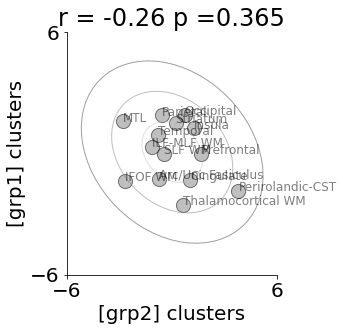

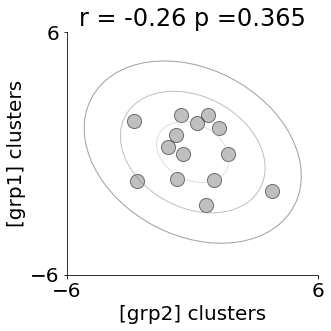

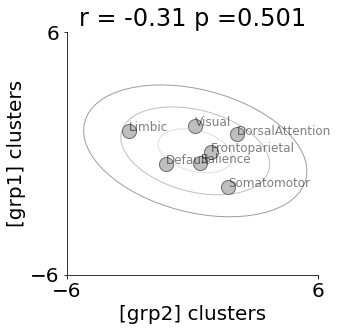

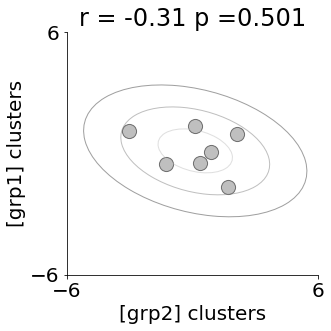

In [13]:
# plot 2d scatter (percent deviation from expected)
# #plot_dict_b['prct_deviation_from_expected']
# C.plot_scatter(np.array(plot_dict_b['prct_deviation_from_expected'])*100,\
#                np.array(plot_dict_a['prct_deviation_from_expected'])*100,\
#                text_lbls=np.array(plot_dict_a['roi_list']),s=200)
# plt.gca().set_xlim((-15,15))
# plt.gca().set_ylim((-10,10))

# chi square stats comparing anat distributions
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    **kwargs
        Forwarded to `~matplotlib.patches.Ellipse`

    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

def plot_anat_scatter(plot_dict_a,plot_dict_b,lbl,lims=(0.5,1.5)):
    counts = np.vstack((np.array(plot_dict_a['counts_thisClusInReg']),np.array(plot_dict_b['counts_thisClusInReg'])))
    chi,p,dof,exp = stats.chi2_contingency(counts)
    print(lbl)
    print('chi-square test comparing frequencies across groups')
    print('chi2',chi)
    print('dof',dof)
    print('p',p)



    # ratio of percent observed vs. percent expected
    x,y = C.plot_scatter(np.array(plot_dict_b['binom_zvals']),\
                   np.array(plot_dict_a['binom_zvals']),\
                   text_lbls=np.array(plot_dict_a['roi_list']),s=200,figsize=(5,5),text_offset_x=0,text_offset_y=0)
    #x,y = C.plot_scatter(np.array(plot_dict_b['prct_obs'])/plot_dict_b['prct_exp'],\
    #               np.array(plot_dict_a['prct_obs'])/plot_dict_a['prct_exp'],\
    #              text_lbls=np.array(plot_dict_a['roi_list']),s=200,figsize=(5,5),text_offset_x=0,text_offset_y=0)
    plt.gca().set_ylabel('[grp1] clusters')
    plt.gca().set_xlabel('[grp2] clusters')
    plt.gca().set_xlim(lims)
    plt.gca().set_ylim(lims)
    plt.gca().set_xticks(np.round(lims,1))
    plt.gca().set_yticks(np.round(lims,1))
    #plt.gca().fill_between((0,1),(1,1),alpha=0.25,color='k')
    confidence_ellipse(x,y,plt.gca(),n_std=1,edgecolor='0.75',alpha=0.5)
    confidence_ellipse(x,y,plt.gca(),n_std=2,edgecolor='0.5',alpha=0.5)
    confidence_ellipse(x,y,plt.gca(),n_std=3,edgecolor='0.25',alpha=0.5)
    save_fig(lbl)


    # ratio of percent observed vs. percent expected
    #C.plot_scatter(np.array(plot_dict_b['prct_obs'])/plot_dict_b['prct_exp'],\
    #               np.array(plot_dict_a['prct_obs'])/plot_dict_a['prct_exp'],\
    #               text_lbls=None,s=200,figsize=(5,5),text_offset_x=0,text_offset_y=0)
    C.plot_scatter(np.array(plot_dict_b['binom_zvals']),\
                   np.array(plot_dict_a['binom_zvals']),\
                   text_lbls=None,s=200,figsize=(5,5),text_offset_x=0,text_offset_y=0)
    plt.gca().set_ylabel('[grp1] clusters')
    plt.gca().set_xlabel('[grp2] clusters')
    plt.gca().set_xlim(lims)
    plt.gca().set_ylim(lims)
    plt.gca().set_xticks(np.round(lims,1))
    plt.gca().set_yticks(np.round(lims,1))
    confidence_ellipse(x,y,plt.gca(),n_std=1,edgecolor='0.75',alpha=0.5)
    confidence_ellipse(x,y,plt.gca(),n_std=2,edgecolor='0.5',alpha=0.5)
    confidence_ellipse(x,y,plt.gca(),n_std=3,edgecolor='0.25',alpha=0.5)
    #plt.gca().fill_between((0,1),(1,1),alpha=0.25,color='k')
    save_fig(lbl+'_NOTEXT')

plot_anat_scatter(plot_dict_a,plot_dict_b,'clus_list_a_vs_b_2d_anatomy',lims=(-6,6))
plot_anat_scatter(plot_dict_a_yeo,plot_dict_b_yeo,'clus_list_a_vs_b_2d_anatomy-YEO',lims=(-6,6))

In [39]:
p = 0.05
stats.norm.ppf(1-p)

1.6448536269514722

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.




spatial n elec =  173 n subj =  22


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.




motor n elec =  119 n subj =  20


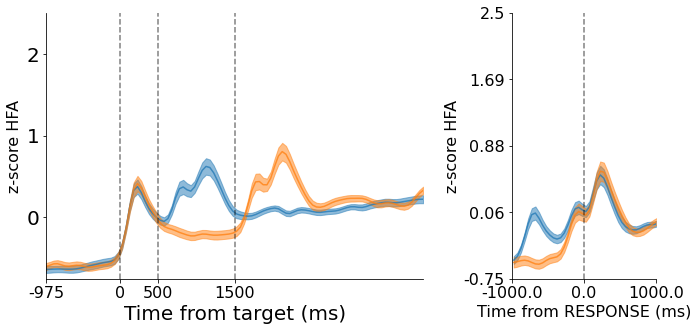

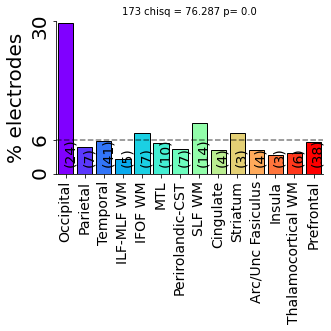

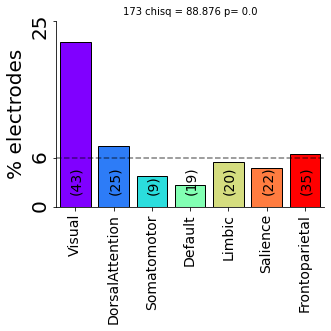

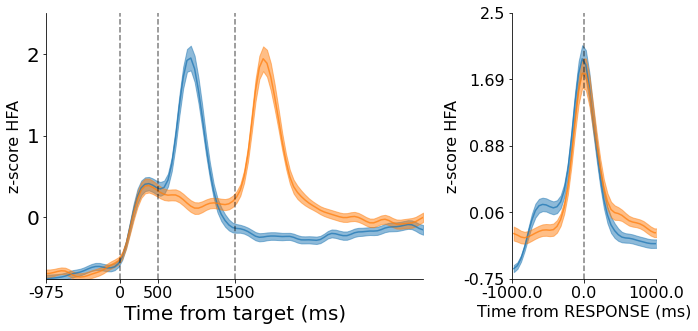

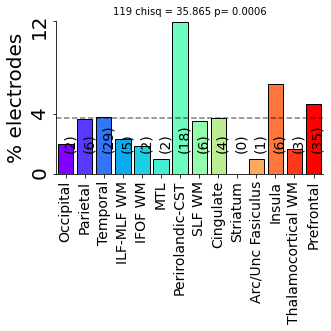

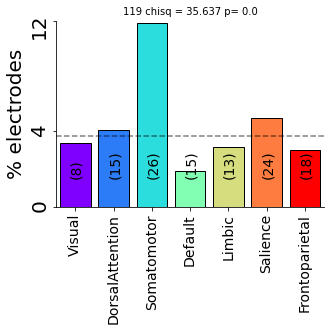

In [44]:
# show localized effects (as positive controls)

ret_dict = C.groupElectrodesByTaskStats()
yL = (-.75,2.5)
#plot_dict_a = evalClus_wrapper2(ret_dict['ret_idx_spatialSel']&ret_dict['ret_idx_anat_left'],beh_feat=beh_feat,yL = yL,lbl='fix_inc',atlas='yeo',binByRT = False,show_false_alarms = False)
plot_dict_a,plot_dict_a_yeo = evalClus_wrapper2(ret_dict['ret_idx_spatialSel'],beh_feat=beh_feat,yL = yL,lbl='spatial',binByRT = False,show_false_alarms = False)

#resp_locked = evalClus_wrapper2(ret_dict['ret_idx_respLocked'],beh_feat=beh_feat,yL = yL,lbl='resp_locked',atlas='default',binByRT = False,show_false_alarms = False)
#plot_dict_b = evalClus_wrapper2(ret_dict['ret_idx_grp_motor_left'],beh_feat=beh_feat,yL = yL,lbl='resp_locked',atlas='yeo',binByRT = False,show_false_alarms = False)
plot_dict_b,plot_dict_b_yeo = evalClus_wrapper2(ret_dict['ret_idx_grp_motor'],beh_feat=beh_feat,yL = yL,lbl='motor',binByRT = False,show_false_alarms = False)

spatial_v_motor_2d_anatomy
chi-square test comparing frequencies across groups
chi2 35.035759088576896
dof 13
p 0.0008360343044277658
spatial_v_motor_2d_anatomy-YEO
chi-square test comparing frequencies across groups
chi2 33.428930906543386
dof 6
p 8.669773824742678e-06


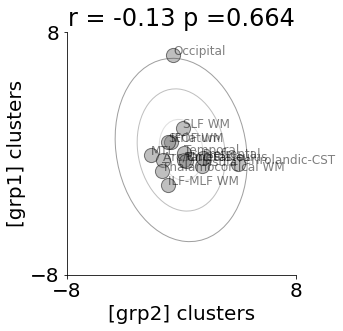

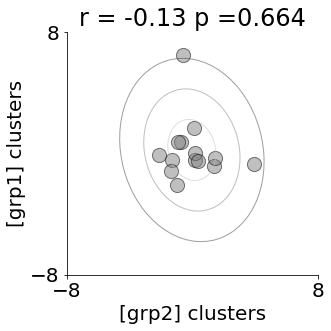

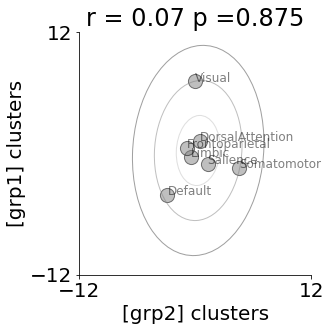

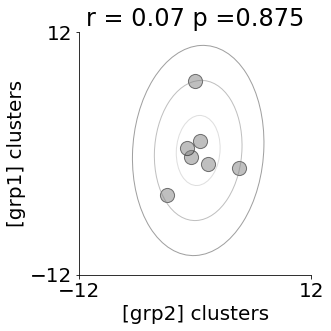

In [45]:
plot_anat_scatter(plot_dict_a,plot_dict_b,'spatial_v_motor_2d_anatomy',lims=(-8,8))
plot_anat_scatter(plot_dict_a_yeo,plot_dict_b_yeo,'spatial_v_motor_2d_anatomy-YEO',lims=(-12,12))



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.




clus id 0 n elec =  2609 n subj =  23


/home/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:9187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(np.abs(ax.get_yticks()).astype('int'))
/home/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:9304: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(np.abs(ax.get_yticks()).astype('int'))


([1.0],
 ['0-0'],
   clusId  n_obs  chiSq    p
 0    0-0   2609    0.0  1.0)

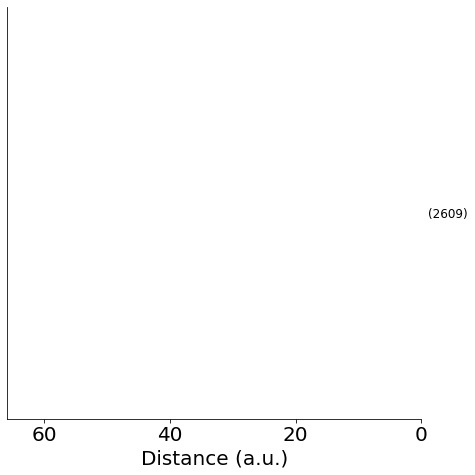

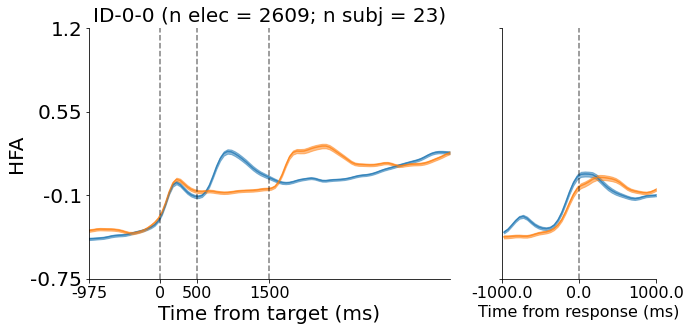

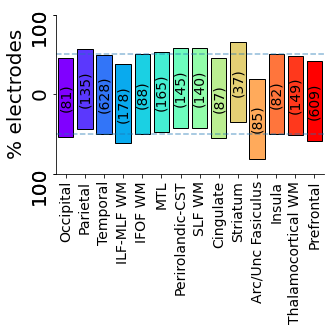

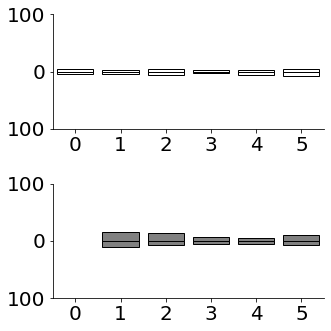

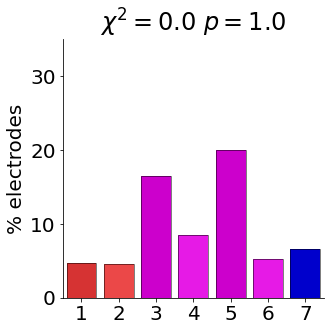

In [50]:
#"Null Hypothesis": illustrate feature matrix and evaluate cluster when consideting all electrodes as a single group
explore_level(cut_level=0,beh_feat=beh_feat,yL=(-.75,1.2))



clus id 0 n elec =  2609 n subj =  23


No handles with labels found to put in legend.
No handles with labels found to put in legend.
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11309: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11309: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsInClus.append(np.sum((x[ret_idx]>0)&(pvals[ret_idx]<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11310: RuntimeWarning: invalid value encountered in greater
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_func.py:11310: RuntimeWarning: invalid value encountered in less_equal
  finger_sel_obsTot.append(np.sum((x>0)&(pvals<=p_thresh)))
/Users/ashwinramayya/Dropbox/neurosurgery_research/jupyter/ccdt/ccdt_f

([1.0], ['0-0'],   clusId  n_obs  chiSq    p
 0    0-0   2609    0.0  1.0)

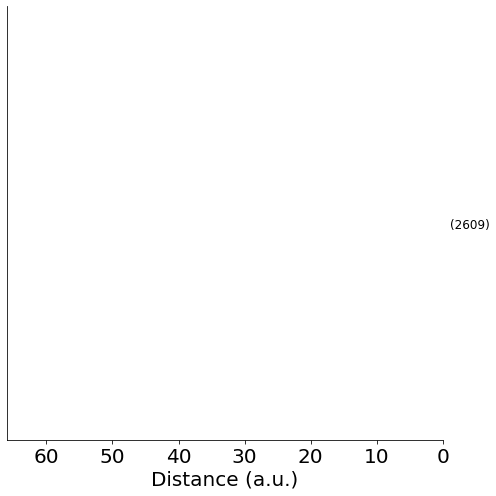

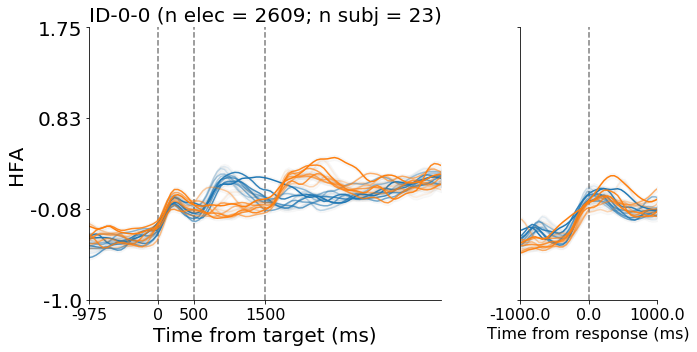

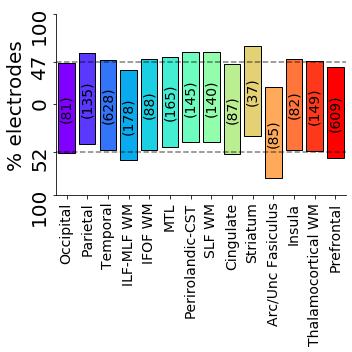

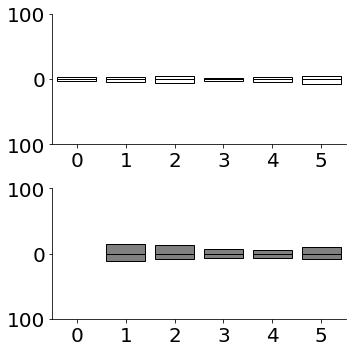

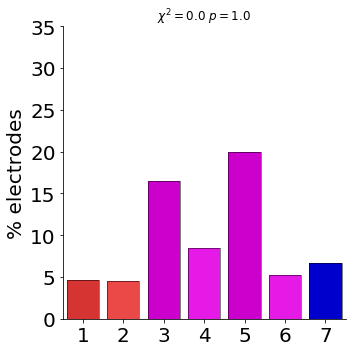

In [43]:

## level = 2
explore_level(cut_level=0,beh_feat=beh_feat, yL=(-1,1.75))

In [17]:
# self =C
# subj_filt_query = 'error_diff<0.25'
# subj_to_include = np.array(self.behXSubj_df.query(subj_filt_query).index)  
# subj_ret_idx = np.isin(np.array(self.subj_list),subj_to_include)
# len(subj_ret_idx)

2609

[['12-6-S0c-paramsDiff_B-DelayDiff' '0.952']
 ['12-6-postCC-paramsDiff_B-DelayDiff' '0.996']
 ['12-11-postCC-paramsDiff_B-DelayDiff' '0.838']
 ['12-9-preResponse-paramsDiff_B-DelayDiff' '0.838']]


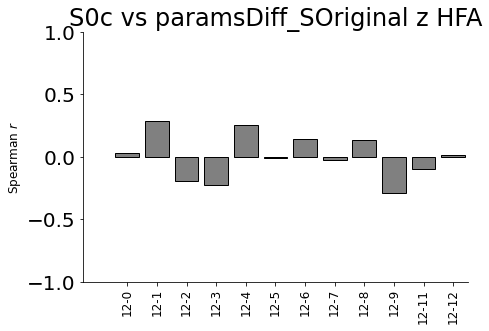

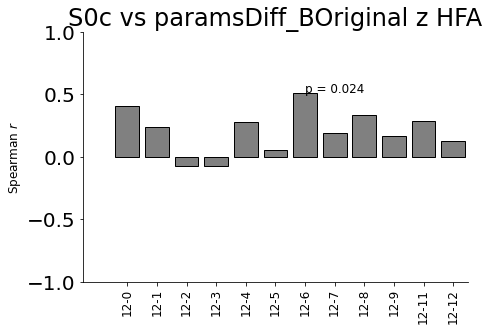

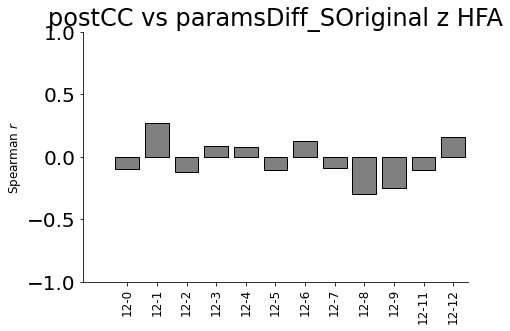

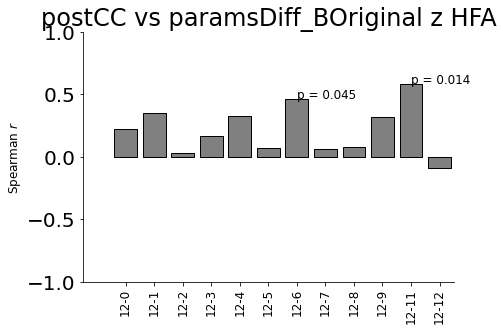

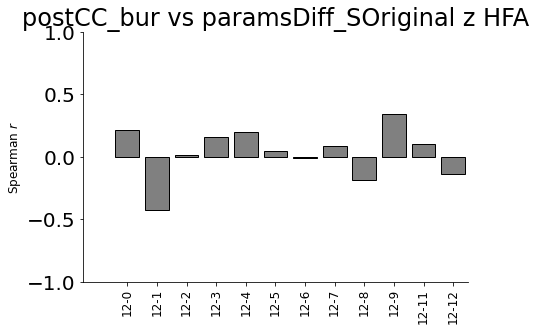

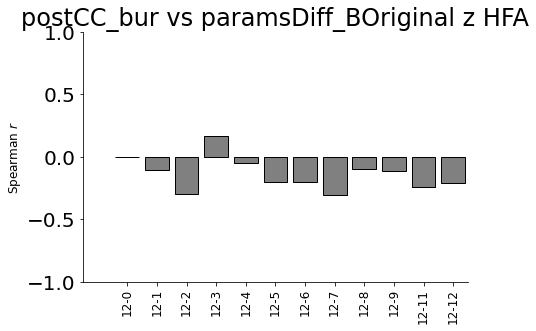

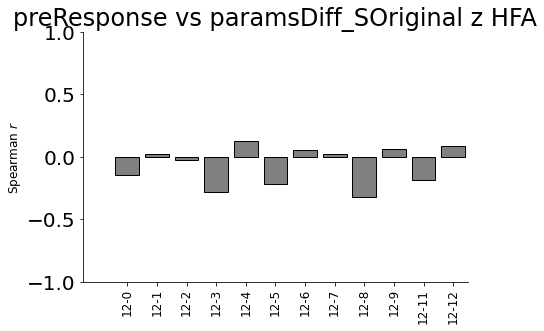

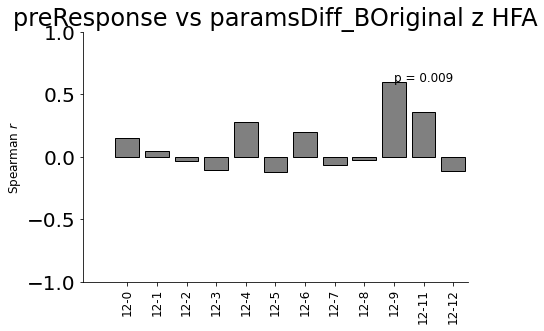

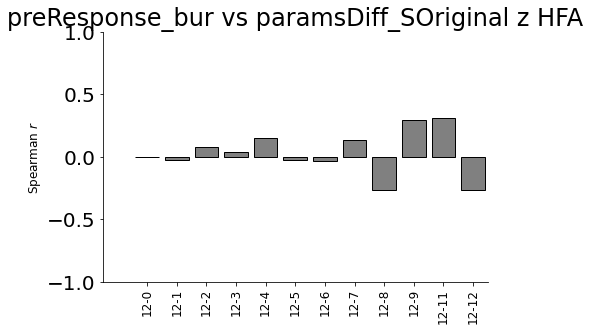

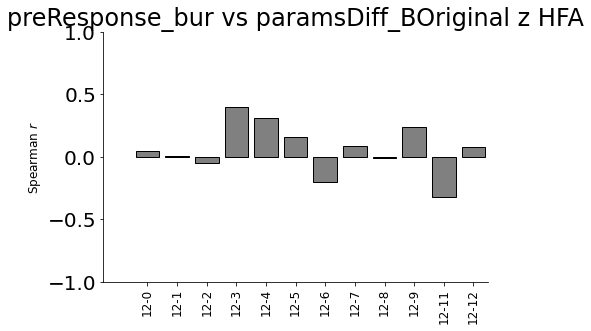

In [14]:
## eval xSubj correlations between neural features and behavior (and FDR correction)
use_clean = False
figsize = (7,5)
subj_filt_query = ''#'er|ror_diff<0.25'

# Justify these features based on the dynamics analysis
neu_feat_list =['S0c','postCC','postCC_bur','preResponse','preResponse_bur'] #'S0c',
p_list = []
stat_lbls = []

for neu_feat in neu_feat_list:
    
# #   Change in LATER distance: 
# #   delay diff vs. LATER 2 diff in sensitivity (USE CLEAN DATA = FALSE)
    plot_dict = C.evalClusLevel_xSubjCorr_delayDiff(cut_level = cut_level, beh_xSubj = 'paramsDiff_S', \
                                           neu_feat=neu_feat, use_clean = False,subj_filt_query=subj_filt_query)    
    #update pvals and lbls
    p_list.extend(list(plot_dict['pvals']))
    stat_lbls.extend(list(plot_dict['stat_lbls']))
    
    
# #  stochastic RT encoding vs. difference in model parameters (USE CLEAN DATA = TRUE)
#     plot_dict = C.evalClusLevel_xSubjCorr_rtCorr(cut_level = cut_level, beh_xSubj = 'paramsDiff_S', \
#                                           neu_feat=neu_feat, use_clean = True, \
#                                           beh_feat =beh_feat, delay_str = '',\
#                                           compare_delay = False,subj_filt_query=subj_filt_query) 
#     #update pvals and lbls
#     p_list.extend(list(plot_dict['pvals']))
#     stat_lbls.extend(list(plot_dict['stat_lbls']))


# #   Change in LATER Prediction Bias: 
#   delay diff vs. LATER 2 diff in distance (USE CLEAN DATA = FALSE)
    plot_dict = C.evalClusLevel_xSubjCorr_delayDiff(cut_level = cut_level, beh_xSubj = 'paramsDiff_B', \
                                           neu_feat=neu_feat, use_clean = False,subj_filt_query=subj_filt_query)    
    #update pvals and lbls
    p_list.extend(list(plot_dict['pvals']))
    stat_lbls.extend(list(plot_dict['stat_lbls']))
    
    
# #  stochastic RT encoding vs. difference in model parameters (USE CLEAN DATA = TRUE)
#     plot_dict = C.evalClusLevel_xSubjCorr_rtCorr(cut_level = cut_level, beh_xSubj = 'paramsDiff_B', \
#                                           neu_feat=neu_feat, use_clean = True, \
#                                           beh_feat =beh_feat, delay_str = '',\
#                                           compare_delay = False,subj_filt_query=subj_filt_query) 
#     #update pvals and lbls
#     p_list.extend(list(plot_dict['pvals']))
#     stat_lbls.extend(list(plot_dict['stat_lbls']))

    

#FDR correction
from statsmodels.stats.multitest import multipletests as FDR

# make sure there are no nans
p_list = np.array(p_list)
p_list[np.isnan(p_list)]=1
reject,pvals_corrected,AS,AB =  FDR(pvals = p_list, alpha = 0.05,method = 'fdr_bh')

print(np.hstack((np.array(stat_lbls).squeeze()[np.array(p_list)<=0.05][:,np.newaxis],\
                 np.array(np.round(pvals_corrected,3)).squeeze()[np.array(p_list)<=0.05][:,np.newaxis])))

[['12-0-S0c-paramsDiff_B-DelayDiff' '0.384']
 ['12-6-S0c-paramsDiff_B-DelayDiff' '0.383']
 ['12-11-postCC-paramsDiff_B-DelayDiff' '0.412']
 ['12-7-postCC_bur-paramsDiff_B-DelayDiff' '0.383']
 ['12-3-preResponse_bur-paramsDiff_B-DelayDiff' '0.008']]


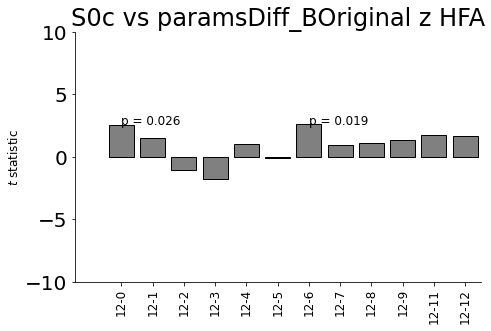

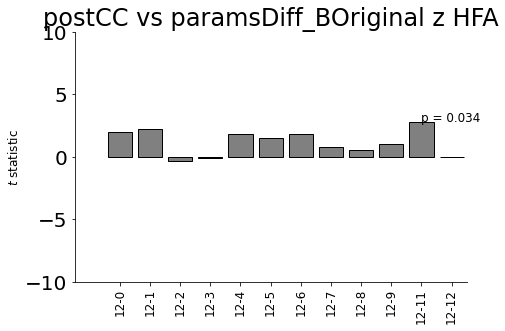

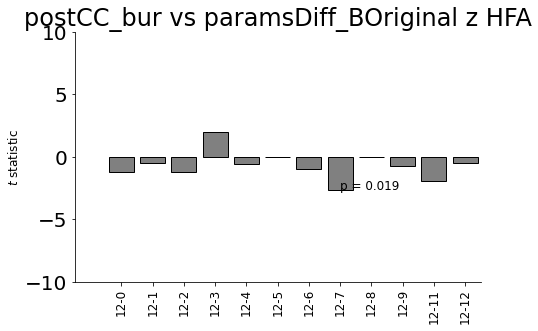

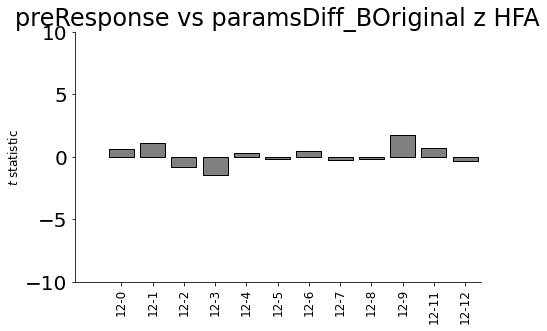

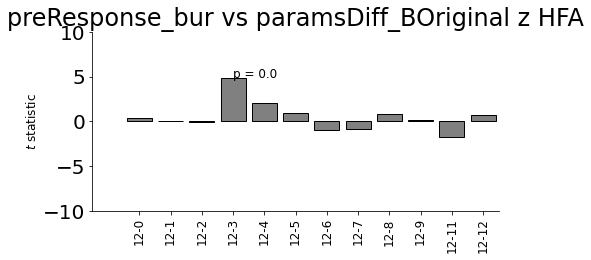

In [15]:
## eval xSubj correlations between neural features and behavior (and FDR correction)
use_clean = False
figsize = (7,5)
subj_filt_query = ''#'er|ror_diff<0.25'

# Justify these features based on the dynamics analysis
neu_feat_list = ['S0c','postCC','postCC_bur','preResponse','preResponse_bur'] #'S0c',
p_list = []
stat_lbls = []
do_ttest=True
subj_grp_query = 'paramsDiff_B>0.1'


for neu_feat in neu_feat_list:
    

# #   Change in LATER Prediction Bias: 
#   delay diff vs. LATER 2 diff in distance (USE CLEAN DATA = FALSE)
    plot_dict = C.evalClusLevel_xSubjCorr_delayDiff(cut_level = cut_level, beh_xSubj = 'paramsDiff_B', \
                                           neu_feat=neu_feat, \
                                                    use_clean = False,\
                                                    subj_filt_query=subj_filt_query,do_ttest=do_ttest,subj_grp_query =subj_grp_query)    
    plt.gca().set_ylim([-10,10])
    #update pvals and lbls
    p_list.extend(list(plot_dict['pvals_t']))
    stat_lbls.extend(list(plot_dict['stat_lbls']))

    

#FDR correction
from statsmodels.stats.multitest import multipletests as FDR

# make sure there are no nans
p_list = np.array(p_list)
p_list[np.isnan(p_list)]=1
reject,pvals_corrected,AS,AB =  FDR(pvals = p_list, alpha = 0.05,method = 'fdr_bh')

print(np.hstack((np.array(stat_lbls).squeeze()[np.array(p_list)<=0.05][:,np.newaxis],\
                 np.array(np.round(pvals_corrected,3)).squeeze()[np.array(p_list)<=0.05][:,np.newaxis])))

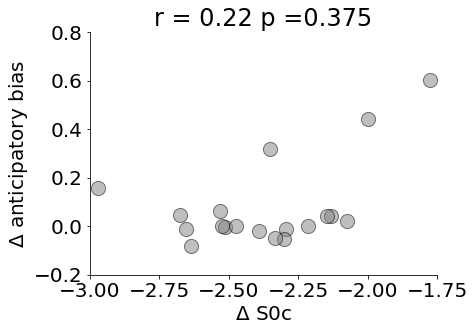

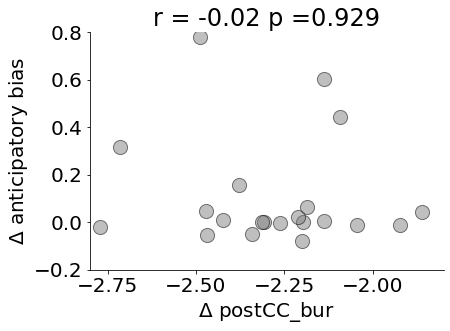

In [25]:
# Specific cluster correlation with bias parameter

clusid = 3
neu_feat='S0c'
#neu_feat='preResponse_bur'
ret_idx = C.clus_cut_tree[:,cut_level]==clusid
C.plotXSubjCorr(ax=None,beh_xSubj='paramsDiff_B',beh_feat=beh_feat,neu_feat=neu_feat,use_clean = False, ret_idx = ret_idx,figsize=(7,5))
plt.gca().set_ylabel('$\Delta$ anticipatory bias',fontsize=20)
plt.gca().set_xlabel('$\Delta$ '+ neu_feat,fontsize=20)
plt.tight_layout()


clusid = 5
neu_feat='postCC_bur'
#neu_feat='preResponse_bur'
ret_idx = C.clus_cut_tree[:,cut_level]==clusid
C.plotXSubjCorr(ax=None,beh_xSubj='paramsDiff_B',beh_feat=beh_feat,neu_feat=neu_feat,use_clean = False, ret_idx = ret_idx,figsize=(7,5))
plt.gca().set_ylabel('$\Delta$ anticipatory bias',fontsize=20)
plt.gca().set_xlabel('$\Delta$ '+ neu_feat,fontsize=20)
plt.tight_layout()
# #save_fig('37-21-S0c_vs_bias')

In [ ]:
clusid = 6
neu_feat='preResponse_bur'
#neu_feat='preResponse_bur'
ret_idx = C.clus_cut_tree[:,cut_level]==clusid
C.plotXSubjDelayDiff(ax=None,beh_xSubj='paramsDiff_B',neu_feat=neu_feat,use_clean = False, ret_idx = ret_idx,figsize=(7,5),s=400)
plt.gca().set_ylabel('$\Delta$ anticipatory bias',fontsize=20)
plt.gca().set_xlabel('$\Delta$ '+ neu_feat,fontsize=20)
plt.tight_layout()
#save_fig('37-21-S0c_vs_bias')

clusid =4 
neu_feat='preResponse_bur'
ret_idx = C.clus_cut_tree[:,cut_level]==clusid
C.plotXSubjDelayDiff(ax=None,beh_xSubj='paramsDiff_B',neu_feat=neu_feat,use_clean = False, ret_idx = ret_idx,figsize=(7,5),s=400)
plt.gca().set_ylabel('$\Delta$ anticipatory bias',fontsize=20)
plt.gca().set_xlabel('$\Delta$ '+ neu_feat,fontsize=20)
plt.tight_layout()
#save_fig('37-21-S0c_vs_bias')

clusid = 5
neu_feat='preResponse'
ret_idx = C.clus_cut_tree[:,cut_level]==clusid
C.plotXSubjDelayDiff(ax=None,beh_xSubj='paramsDiff_B',neu_feat=neu_feat,use_clean = False, ret_idx = ret_idx,figsize=(7,5),s=400)
plt.gca().set_ylabel('$\Delta$ anticipatory bias',fontsize=20)
plt.gca().set_xlabel('$\Delta$ '+ neu_feat,fontsize=20)
plt.tight_layout()
#save_fig('37-21-S0c_vs_bias')

[['21-15-preResponse_bur-paramsDiff_S-DelayDiff' '0.077']]


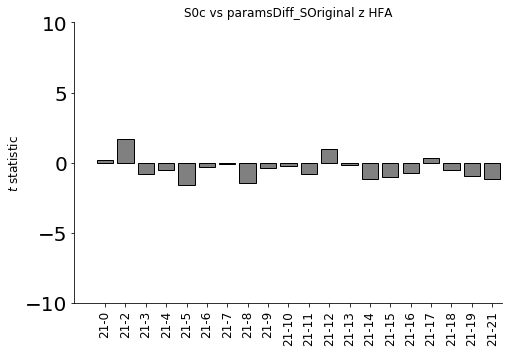

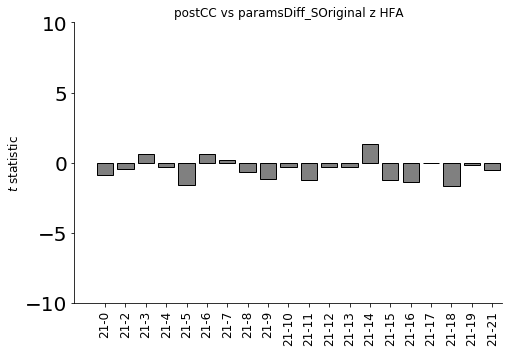

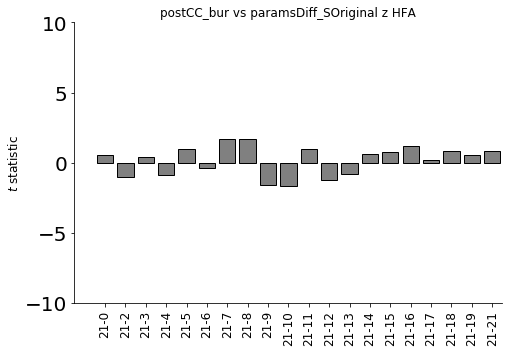

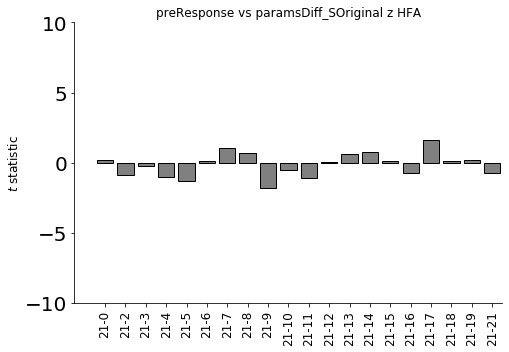

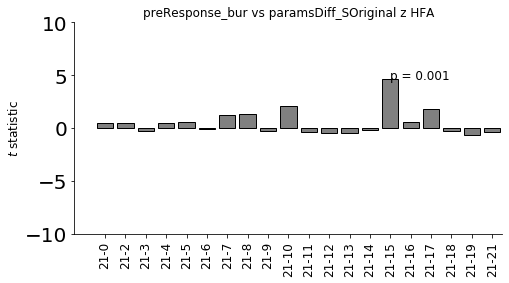

In [40]:
## eval delay-related differences after splitting by paramsDiff_S only for the subjects that didnt show an anticipation bias 
use_clean = False
figsize = (7,5)
subj_filt_query = 'paramsDiff_B<0.1'#

# Justify these features based on the dynamics analysis
neu_feat_list = ['S0c','postCC','postCC_bur','preResponse','preResponse_bur'] #'S0c',
p_list = []
stat_lbls = []
do_ttest=True
subj_grp_query = 'paramsDiff_S>0'


for neu_feat in neu_feat_list:
    

# #   Change in LATER Prediction Bias: 
#   delay diff vs. LATER 2 diff in distance (USE CLEAN DATA = FALSE)
    plot_dict = C.evalClusLevel_xSubjCorr_delayDiff(cut_level = cut_level, beh_xSubj = 'paramsDiff_S', \
                                           neu_feat=neu_feat, \
                                                    use_clean = False,\
                                                    subj_filt_query=subj_filt_query,do_ttest=do_ttest,subj_grp_query =subj_grp_query)    
    plt.gca().set_ylim([-10,10])
    #update pvals and lbls
    p_list.extend(list(plot_dict['pvals_t']))
    stat_lbls.extend(list(plot_dict['stat_lbls']))

    

#FDR correction
from statsmodels.stats.multitest import multipletests as FDR

# make sure there are no nans
p_list = np.array(p_list)
p_list[np.isnan(p_list)]=1
reject,pvals_corrected,AS,AB =  FDR(pvals = p_list, alpha = 0.05,method = 'fdr_bh')

print(np.hstack((np.array(stat_lbls).squeeze()[np.array(p_list)<=0.05][:,np.newaxis],\
                 np.array(np.round(pvals_corrected,3)).squeeze()[np.array(p_list)<=0.05][:,np.newaxis])))